In [1]:
from tqdm import tqdm
from etnn.nn.baseline import create_baseline_model, calc_params
import pandas as pd
import os
from sklearn.metrics import r2_score
from etnn.tools.training import train_epoch, eval_epoch
from etnn import TreeNode
from etnn.nn.layer_framework import LayerManagementFramework
from etnn.routines.run_config import choice_trainloader, choice_loss, choice_optim
import torch
from torch.utils.data import random_split, DataLoader
from etnn.data.ferris_wheel import load_pure_ferris_wheel_dataset_single_node
from etnn.tools.training_tools import ConfigStore, seeding_all
import matplotlib.pyplot as plt

In [2]:
dataset_path = "../../datasets/"
test_perc = 0.3
stability_count = 5
label = "tree-advanced" # although irrelevant

In [3]:
def create_plot(
        df,
        what: str = "r2"
) -> None:
    plt.figure()

    # Plot the initial data
    for config_id in df.config_id.unique():
        # make subdataset for config id
        sub_df = df[df.config_id == config_id]
        # plot train test and val
        for mode in ['train', 'test', 'val']:
            # plot training
            if f"{mode}_{what}" in sub_df.columns:
                plt.plot(sub_df.epoch, sub_df[f"{mode}_{what}"], label=f"{config_id}_{mode}-{what}")

    plt.title(f"{what} plot")
    plt.xlabel("epoch")
    plt.ylabel("score")
    if what == "r2":
        plt.ylim(-1, +1)
    elif what == "loss":
        plt.yscale('log')
    plt.legend()
    plt.show()

In [4]:
def run(i, entry, size_elem, normalized, node_type, dataset_size):
    # init default config
    config = ConfigStore(
        in_dim=15,
        hidden_dim=int(entry.params_hidden_dim),
        out_dim=1,
        k=1,
        dataset=-1 if normalized else 0,
        ds_size=dataset_size,
        num_gondolas=-1,
        num_part_pg=-1,
        loss_name='mse',
        optimizer_name='adam',
        num_max_epochs=300, # real: 100
        learning_rate=float(entry.params_learning_rate),
        batch_size=1024,
        early_stop_tol=5,
        use_equal_batcher=bool(entry.params_batcher),
        seed=420,
        label_type=label,
        final_label_factor=5/1000
    )

    # loading dataset
    dataset, df_index = load_pure_ferris_wheel_dataset_single_node(
        node_type=node_type,
        num_elem=size_elem,
        num_to_generate=config.ds_size,
        dataset_path=dataset_path,
        final_label_factor=config.final_label_factor,
        normalize=True if config.dataset == -1 else 0
    )

    if post_normalized:
        dataset.post_normalize()

    # splitting off test dataset
    generator = torch.Generator().manual_seed(config.seed)
    train_ds, test_ds= random_split(
        dataset,
        [1 - test_perc, test_perc],
        generator=generator
    )

    # loaders
    train_loader = choice_trainloader(config, df_index, train_ds)
    test_loader = DataLoader(test_ds, batch_size=4 * config.batch_size, shuffle=False)

    # define device
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # set seed for reproducability
    seeding_all(config.seed)

    # define model
    model = LayerManagementFramework(
        in_dim=config.in_dim,
        tree=TreeNode(node_type, [TreeNode("E", size_elem)]),
        hidden_dim=config.hidden_dim,
        out_dim=config.out_dim,
        k=config.k
    ).to(device)
    print(f"Model params etnn: {calc_params(model)}")

    # learning tools
    criterion = choice_loss(config)
    optimizer = choice_optim(config, model)

    # init score list
    train_r2_list = []
    test_r2_list = []
    train_loss_list = []
    test_loss_list = []

    file_name = f"csvs/single-node_node-type-{node_type}_rank-{i}_normalized-{normalized}_post-normalized-{post_normalized}_n-{size_elem}_dataset-size-{dataset_size}.csv"
    if os.path.isfile(file_name):
        df = pd.read_csv(file_name)
    else:
        # train for specified number of epochs
        for epoch in tqdm(range(config.num_max_epochs)):
            train_loss, train_true_y, train_pred_y = train_epoch(
                model,
                train_loader,
                optimizer,
                device,
                criterion
            )

            test_loss, test_true_y, test_pred_y = eval_epoch(
                model,
                test_loader,
                device,
                criterion
            )

            # calc r2 score and append
            train_r2_list += [r2_score(y_true=train_true_y, y_pred=train_pred_y)]
            test_r2_list += [r2_score(y_true=test_true_y, y_pred=test_pred_y)]
            train_loss_list += [train_loss.item()]
            test_loss_list += [test_loss.item()]

        # REPEAT FOR BASELINE MODEL
        seeding_all(config.seed)
        # %%
        model, _ = create_baseline_model(
            n_params=calc_params(model),
            input_dim=config.in_dim * size_elem,
            n_layer=3,
            output_dim=1
        )
        model = model.to(device)

        optimizer = choice_optim(config, model)

        # train for N epochs
        for epoch in tqdm(range(config.num_max_epochs)):
            train_loss, train_true_y, train_pred_y = train_epoch(
                model,
                train_loader,
                optimizer,
                device,
                criterion
            )

            test_loss, test_true_y, test_pred_y = eval_epoch(
                model,
                test_loader,
                device,
                criterion
            )

            # calc r2 score and append
            train_r2_list += [r2_score(y_true=train_true_y, y_pred=train_pred_y)]
            test_r2_list += [r2_score(y_true=test_true_y, y_pred=test_pred_y)]
            train_loss_list += [train_loss.item()]
            test_loss_list += [test_loss.item()]

        df = pd.DataFrame({
            "config_id": ["etnn"]*config.num_max_epochs + ["baseline"]*config.num_max_epochs,
            "epoch": list(range(1, config.num_max_epochs + 1))*2,
            "train_loss": train_loss_list,
            "test_loss": test_loss_list,
            "train_r2": train_r2_list,
            "test_r2": test_r2_list
        })
        df.to_csv(file_name)

    # plotting
    create_plot(df, "r2")
    create_plot(df, "loss")

# S

In [5]:
node_type = "S"

## Dataset size 10

Rank 1 parameter configuration: Unnamed: 0                                      23
number                                          23
value                                    -3.458148
datetime_start          2023-12-27 16:21:12.192945
datetime_complete       2023-12-27 16:21:12.387951
duration                    0 days 00:00:00.195006
params_batcher                                True
params_hidden_dim                              144
params_k                                         1
params_learning_rate                      0.000043
state                                     COMPLETE
Name: 23, dtype: object
Model params etnn: 57169


100%|██████████| 300/300 [00:01<00:00, 156.72it/s]


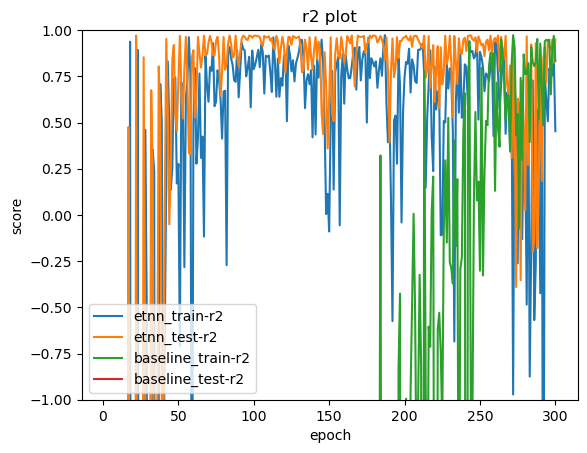

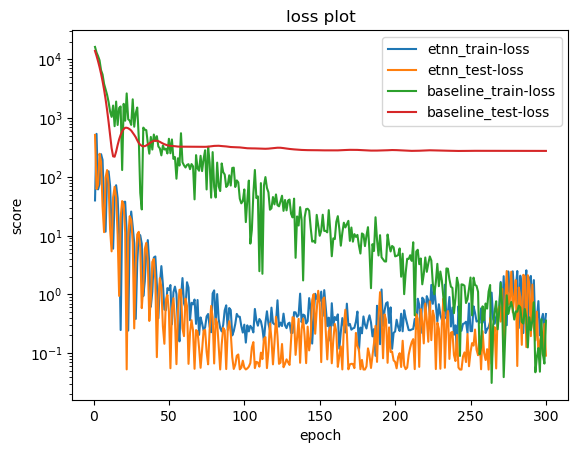

Rank 2 parameter configuration: Unnamed: 0                                      28
number                                          28
value                                   -30.780895
datetime_start          2023-12-27 16:21:13.224098
datetime_complete       2023-12-27 16:21:13.429097
duration                    0 days 00:00:00.204999
params_batcher                                True
params_hidden_dim                               48
params_k                                         2
params_learning_rate                      0.000041
state                                     COMPLETE
Name: 28, dtype: object
Model params etnn: 6961


100%|██████████| 300/300 [00:02<00:00, 146.93it/s]


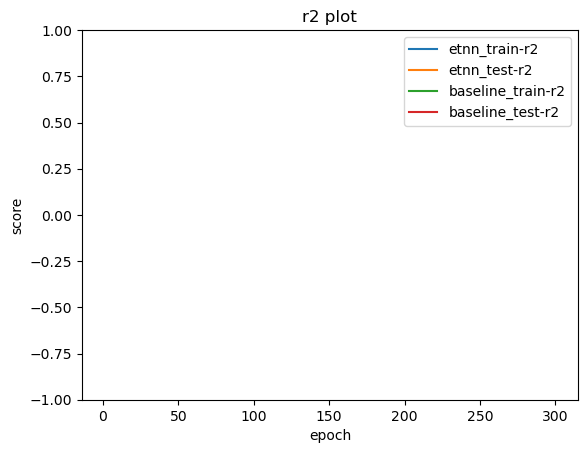

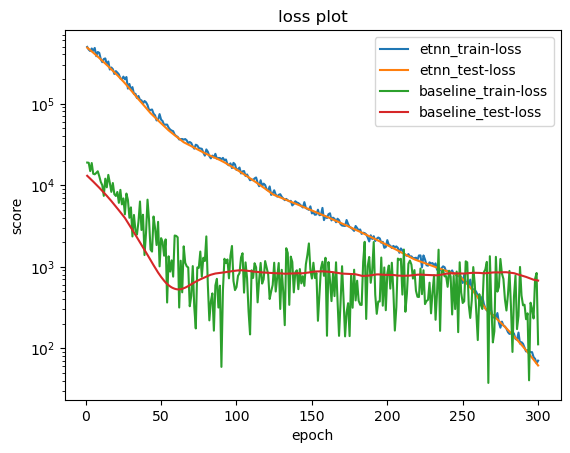

Rank 3 parameter configuration: Unnamed: 0                                      40
number                                          40
value                                   -31.939522
datetime_start          2023-12-27 16:21:15.733140
datetime_complete       2023-12-27 16:21:15.959140
duration                    0 days 00:00:00.226000
params_batcher                               False
params_hidden_dim                              272
params_k                                         1
params_learning_rate                      0.000054
state                                     COMPLETE
Name: 40, dtype: object
Model params etnn: 199377


100%|██████████| 300/300 [00:02<00:00, 134.86it/s]


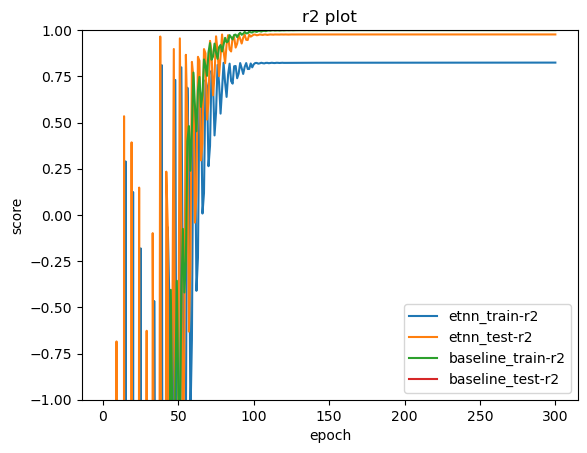

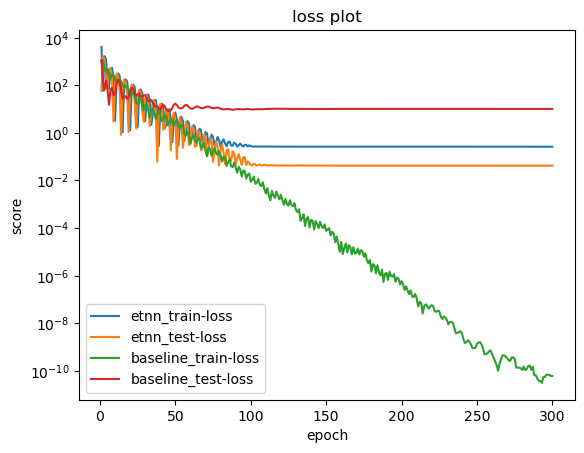

In [6]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     113
number                                         113
value                                  -187.842679
datetime_start          2023-12-27 16:21:48.077419
datetime_complete       2023-12-27 16:21:48.297419
duration                    0 days 00:00:00.220000
params_batcher                               False
params_hidden_dim                              432
params_k                                         2
params_learning_rate                       0.00145
state                                     COMPLETE
Name: 113, dtype: object
Model params etnn: 498097


100%|██████████| 300/300 [00:02<00:00, 146.40it/s]


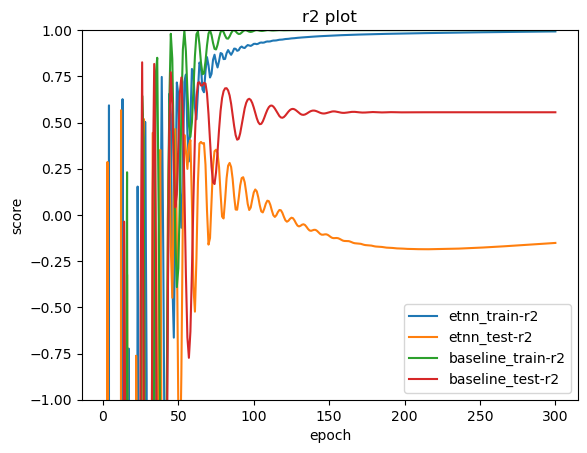

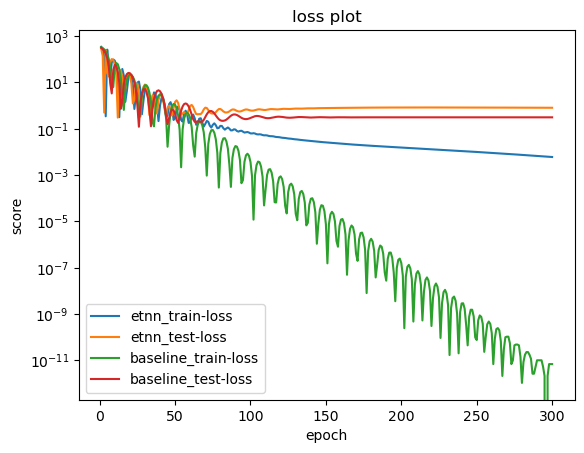

Rank 2 parameter configuration: Unnamed: 0                                     125
number                                         125
value                                  -191.664542
datetime_start          2023-12-27 16:21:50.832407
datetime_complete       2023-12-27 16:21:51.050407
duration                    0 days 00:00:00.218000
params_batcher                                True
params_hidden_dim                              496
params_k                                         2
params_learning_rate                       0.00125
state                                     COMPLETE
Name: 125, dtype: object
Model params etnn: 655217


100%|██████████| 300/300 [00:03<00:00, 85.11it/s] 


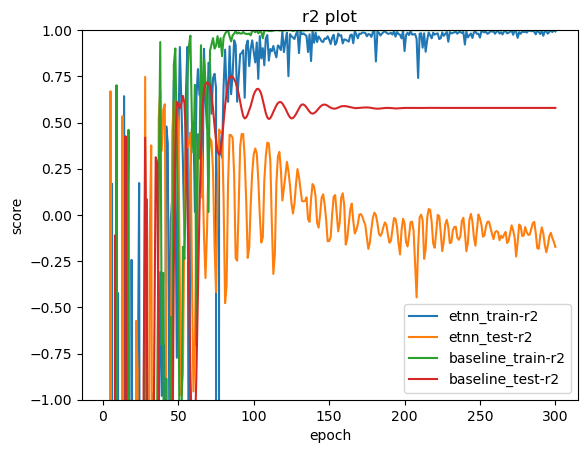

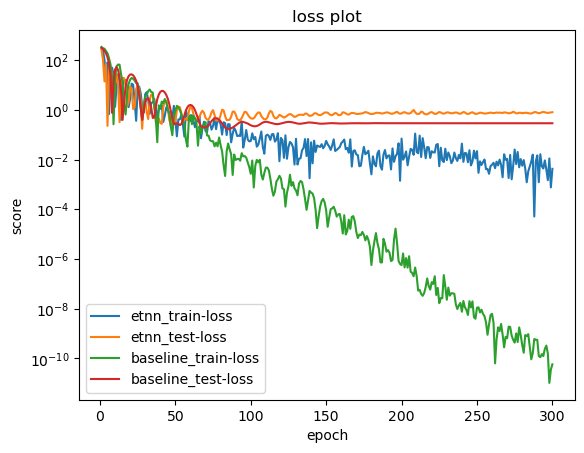

Rank 3 parameter configuration: Unnamed: 0                                     180
number                                         180
value                                  -206.576103
datetime_start          2023-12-27 16:22:03.361207
datetime_complete       2023-12-27 16:22:03.598349
duration                    0 days 00:00:00.237142
params_batcher                                True
params_hidden_dim                              416
params_k                                         4
params_learning_rate                      0.001603
state                                     COMPLETE
Name: 180, dtype: object
Model params etnn: 462177


100%|██████████| 300/300 [00:02<00:00, 135.85it/s]


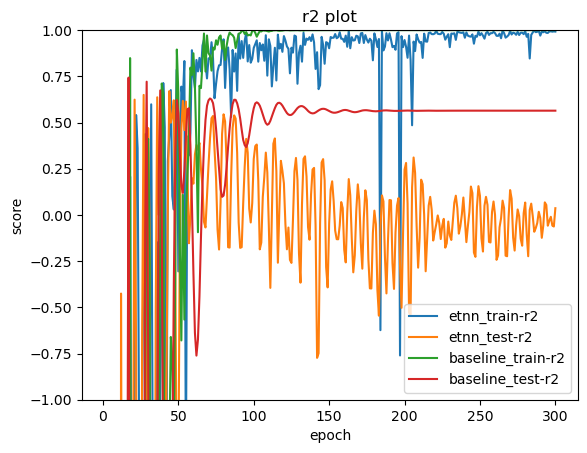

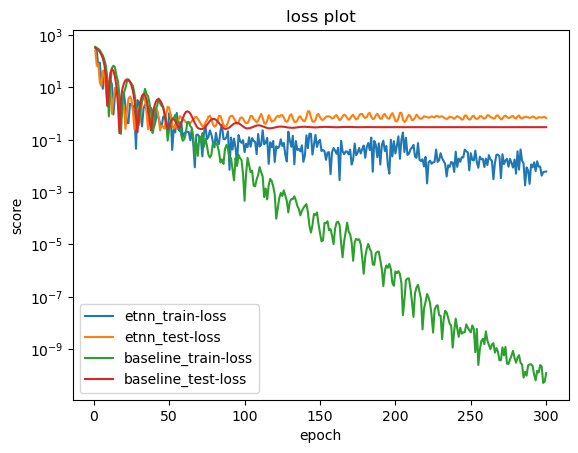

In [7]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                      83
number                                          83
value                                     0.407179
datetime_start          2023-12-27 16:22:28.007219
datetime_complete       2023-12-27 16:22:28.240219
duration                    0 days 00:00:00.233000
params_batcher                               False
params_hidden_dim                              416
params_k                                         3
params_learning_rate                      0.002476
state                                     COMPLETE
Name: 83, dtype: object
Model params etnn: 462177


100%|██████████| 300/300 [00:02<00:00, 120.78it/s]


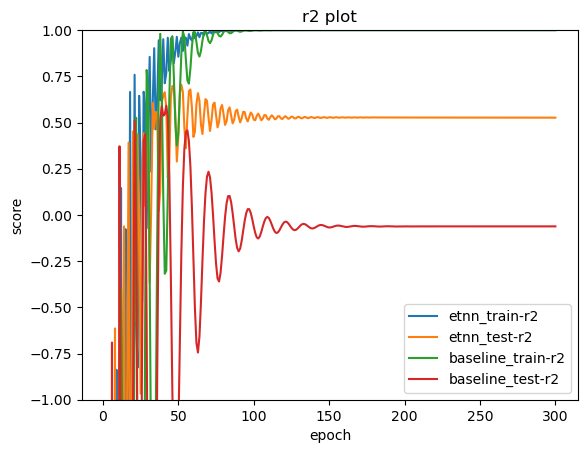

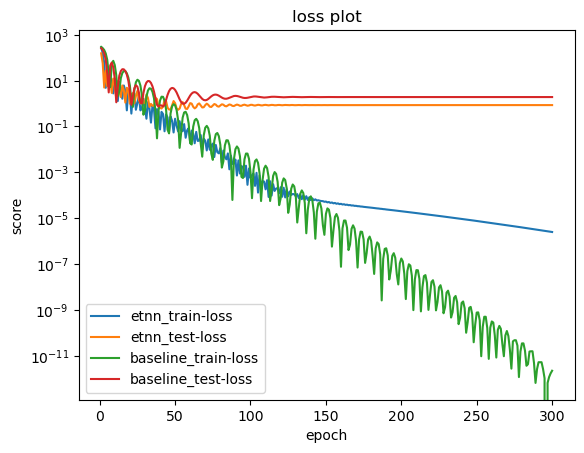

Rank 2 parameter configuration: Unnamed: 0                                     175
number                                         175
value                                     0.126353
datetime_start          2023-12-27 16:22:50.870005
datetime_complete       2023-12-27 16:22:51.104004
duration                    0 days 00:00:00.233999
params_batcher                               False
params_hidden_dim                              416
params_k                                         3
params_learning_rate                      0.002419
state                                     COMPLETE
Name: 175, dtype: object
Model params etnn: 462177


100%|██████████| 300/300 [00:02<00:00, 119.76it/s]


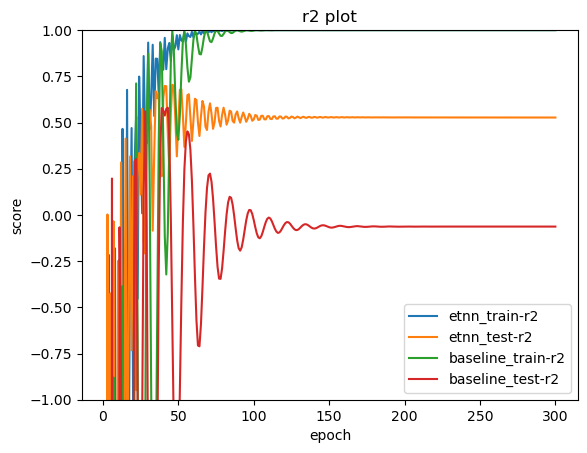

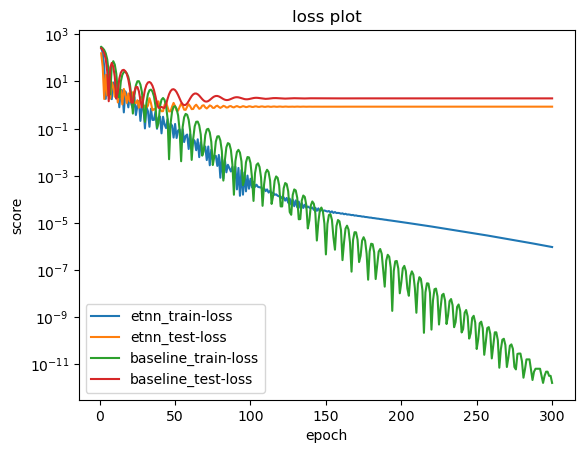

Rank 3 parameter configuration: Unnamed: 0                                      81
number                                          81
value                                     0.125825
datetime_start          2023-12-27 16:22:27.418138
datetime_complete       2023-12-27 16:22:27.771219
duration                    0 days 00:00:00.353081
params_batcher                               False
params_hidden_dim                              416
params_k                                         3
params_learning_rate                      0.002379
state                                     COMPLETE
Name: 81, dtype: object
Model params etnn: 462177


100%|██████████| 300/300 [00:02<00:00, 120.19it/s]


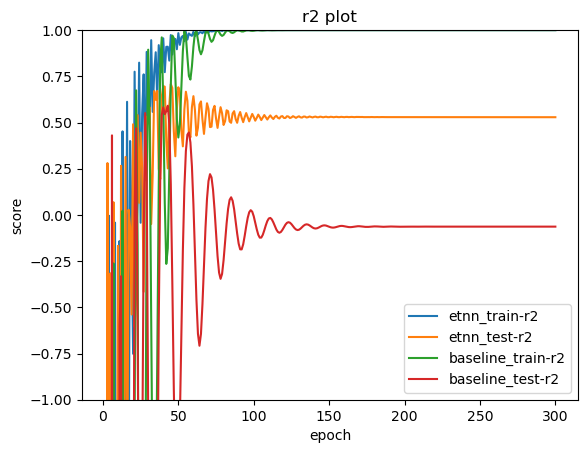

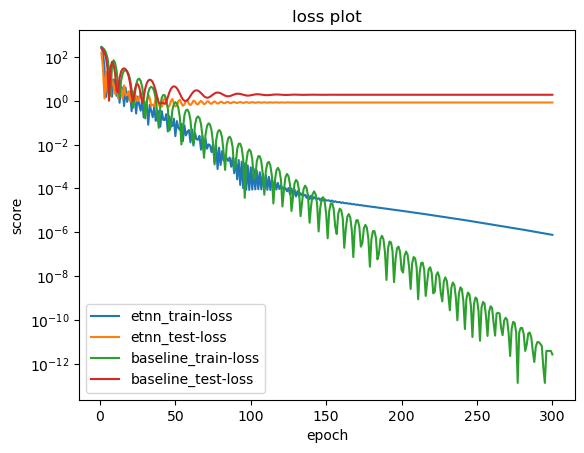

In [8]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

## Dataset size 100

Rank 1 parameter configuration: Unnamed: 0                                      25
number                                          25
value                                      0.86381
datetime_start          2023-12-27 16:23:26.468989
datetime_complete       2023-12-27 16:23:27.353141
duration                    0 days 00:00:00.884152
params_batcher                                True
params_hidden_dim                               64
params_k                                         1
params_learning_rate                      0.000348
state                                     COMPLETE
Name: 25, dtype: object
Model params etnn: 11969


100%|██████████| 300/300 [00:11<00:00, 25.76it/s]


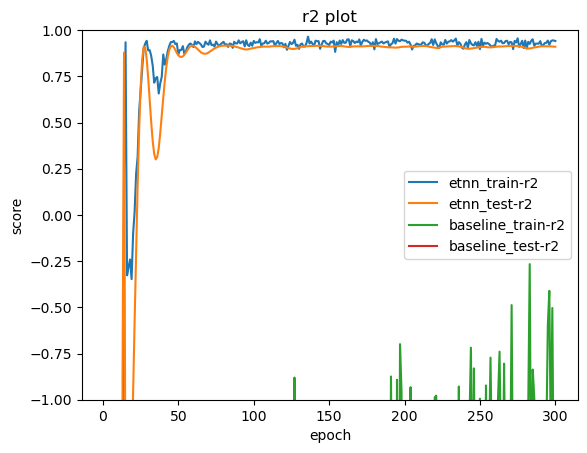

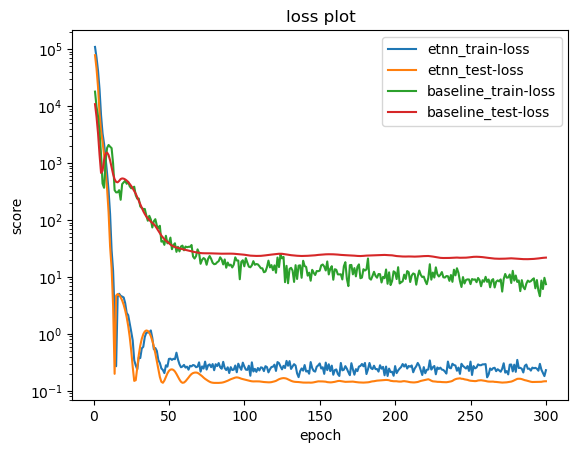

Rank 2 parameter configuration: Unnamed: 0                                      13
number                                          13
value                                     0.858591
datetime_start          2023-12-27 16:23:14.901354
datetime_complete       2023-12-27 16:23:15.802491
duration                    0 days 00:00:00.901137
params_batcher                                True
params_hidden_dim                               16
params_k                                         1
params_learning_rate                      0.000196
state                                     COMPLETE
Name: 13, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [00:11<00:00, 25.92it/s]


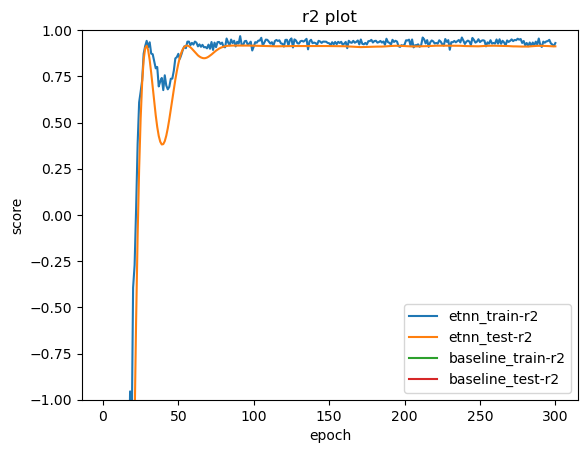

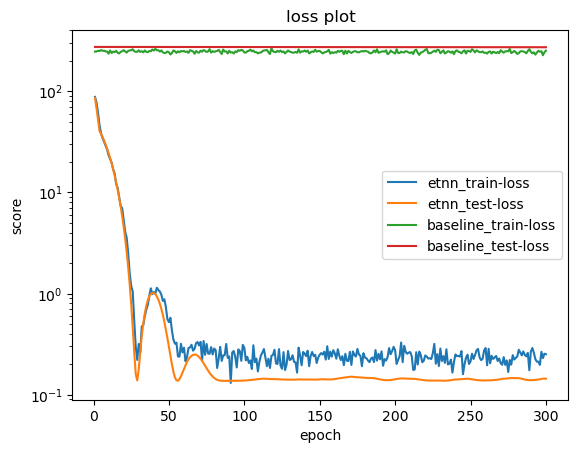

Rank 3 parameter configuration: Unnamed: 0                                      39
number                                          39
value                                     0.671158
datetime_start          2023-12-27 16:23:40.472756
datetime_complete       2023-12-27 16:23:41.355643
duration                    0 days 00:00:00.882887
params_batcher                               False
params_hidden_dim                               64
params_k                                         1
params_learning_rate                      0.000596
state                                     COMPLETE
Name: 39, dtype: object
Model params etnn: 11969


100%|██████████| 300/300 [00:11<00:00, 25.83it/s]


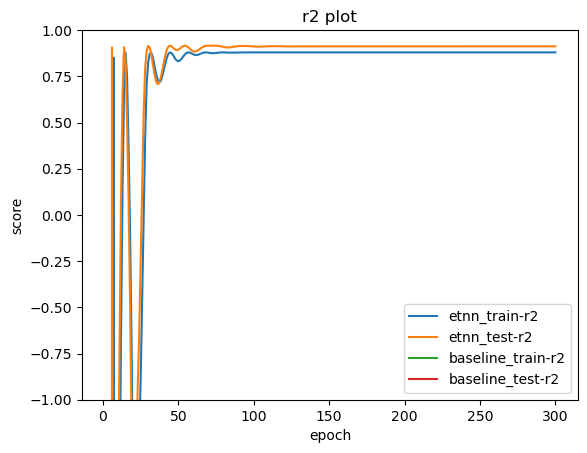

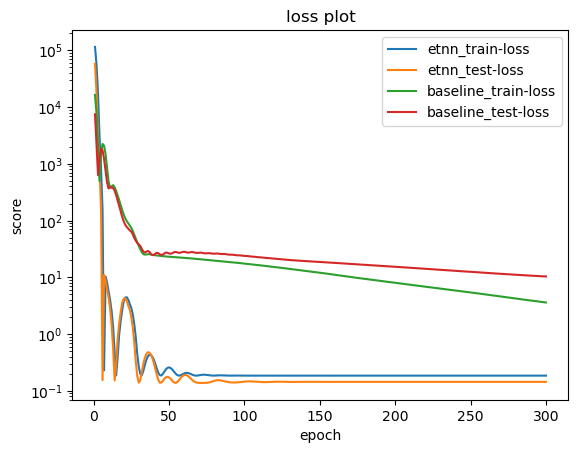

In [9]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     165
number                                         165
value                                     0.720466
datetime_start          2023-12-27 16:26:39.477259
datetime_complete       2023-12-27 16:26:40.473459
duration                    0 days 00:00:00.996200
params_batcher                                True
params_hidden_dim                              336
params_k                                         3
params_learning_rate                      0.003112
state                                     COMPLETE
Name: 165, dtype: object
Model params etnn: 302737


100%|██████████| 300/300 [00:10<00:00, 29.45it/s]


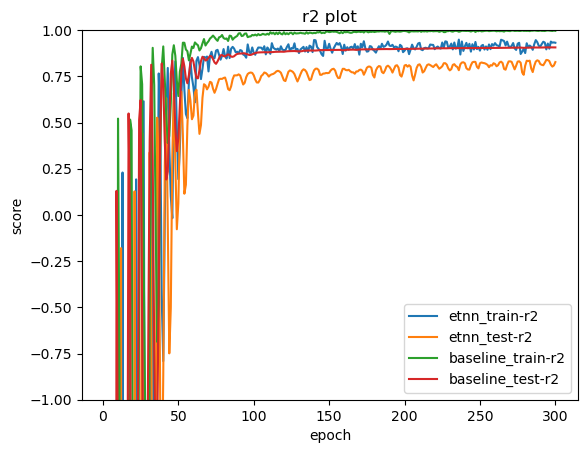

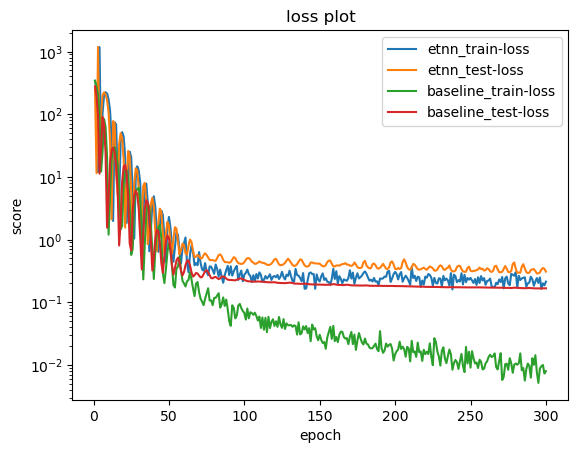

Rank 2 parameter configuration: Unnamed: 0                                     118
number                                         118
value                                     0.698207
datetime_start          2023-12-27 16:25:51.613107
datetime_complete       2023-12-27 16:25:52.589089
duration                    0 days 00:00:00.975982
params_batcher                                True
params_hidden_dim                              336
params_k                                         3
params_learning_rate                        0.0032
state                                     COMPLETE
Name: 118, dtype: object
Model params etnn: 302737


100%|██████████| 300/300 [00:10<00:00, 29.54it/s]


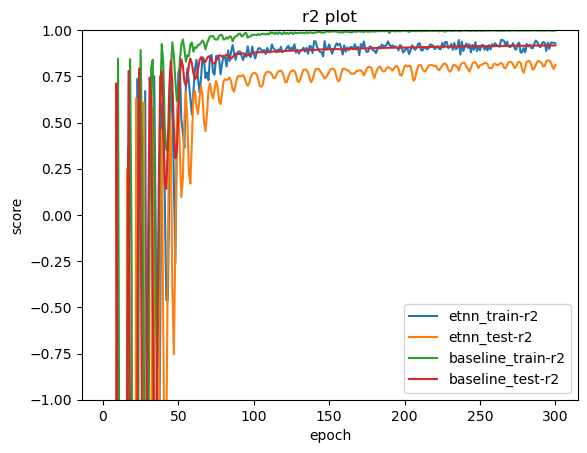

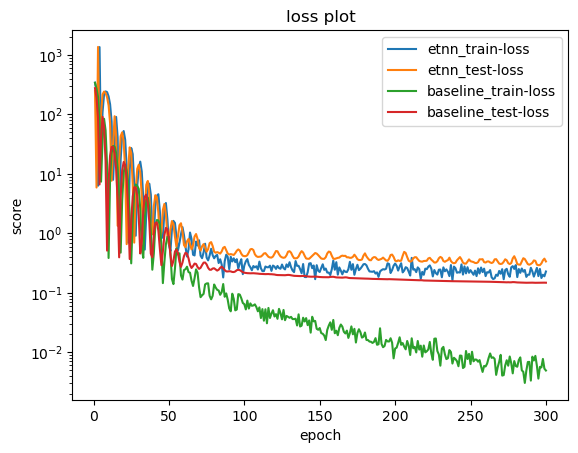

Rank 3 parameter configuration: Unnamed: 0                                     198
number                                         198
value                                     0.686497
datetime_start          2023-12-27 16:27:12.894842
datetime_complete       2023-12-27 16:27:13.864046
duration                    0 days 00:00:00.969204
params_batcher                                True
params_hidden_dim                              336
params_k                                         3
params_learning_rate                      0.003086
state                                     COMPLETE
Name: 198, dtype: object
Model params etnn: 302737


100%|██████████| 300/300 [00:10<00:00, 28.72it/s]


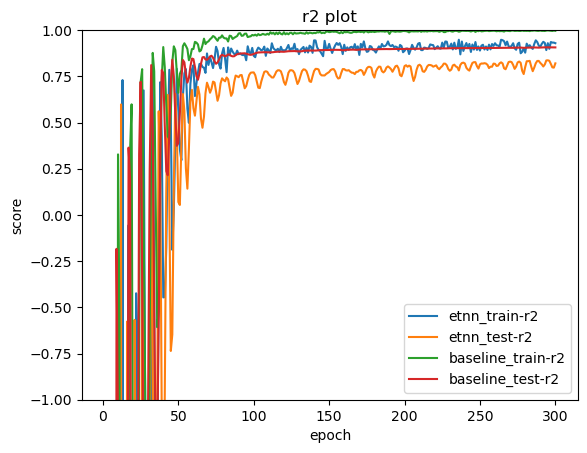

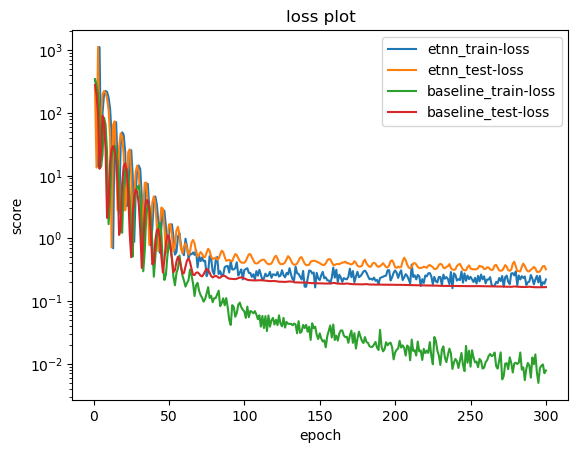

In [10]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     131
number                                         131
value                                     0.719577
datetime_start          2023-12-27 16:29:47.706864
datetime_complete       2023-12-27 16:29:48.719864
duration                    0 days 00:00:01.013000
params_batcher                                True
params_hidden_dim                              208
params_k                                         3
params_learning_rate                      0.004525
state                                     COMPLETE
Name: 131, dtype: object
Model params etnn: 117521


100%|██████████| 300/300 [00:12<00:00, 23.08it/s]


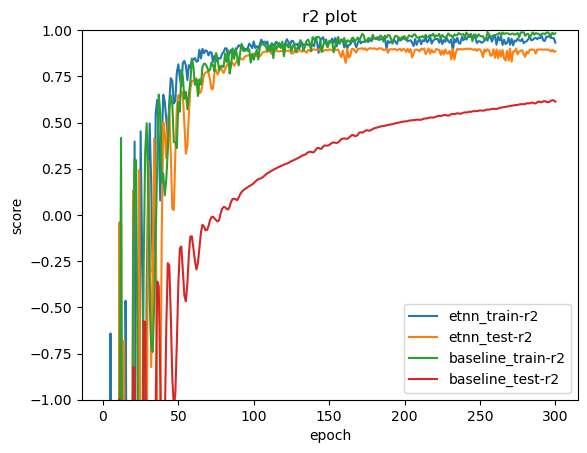

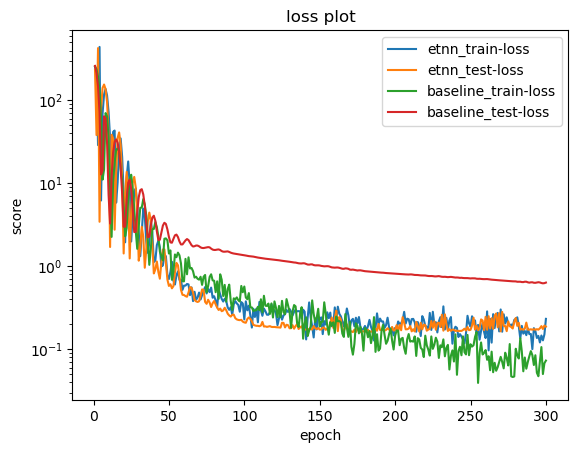

Rank 2 parameter configuration: Unnamed: 0                                     123
number                                         123
value                                     0.704932
datetime_start          2023-12-27 16:29:37.658223
datetime_complete       2023-12-27 16:29:38.944222
duration                    0 days 00:00:01.285999
params_batcher                                True
params_hidden_dim                              240
params_k                                         3
params_learning_rate                      0.003952
state                                     COMPLETE
Name: 123, dtype: object
Model params etnn: 155761


100%|██████████| 300/300 [00:13<00:00, 22.86it/s]


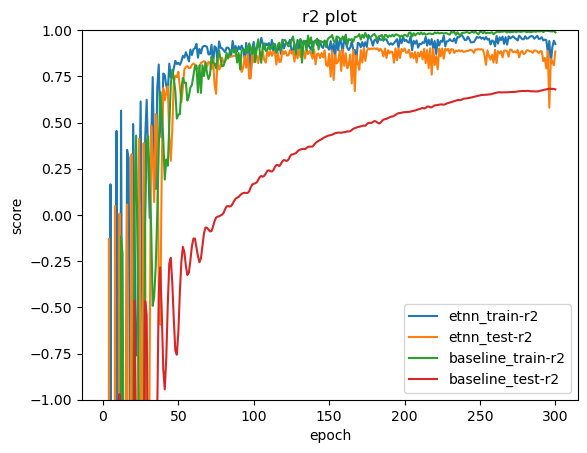

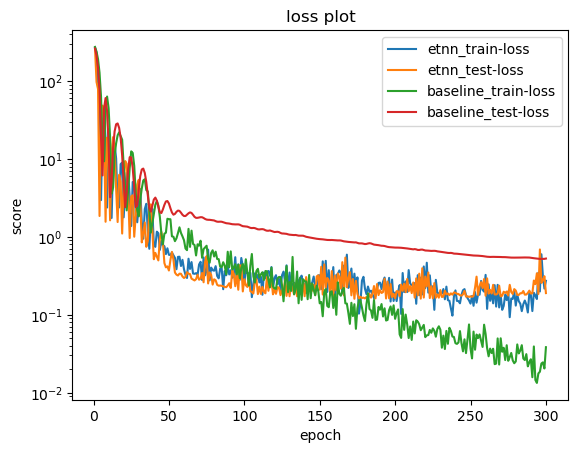

Rank 3 parameter configuration: Unnamed: 0                                      98
number                                          98
value                                     0.694833
datetime_start          2023-12-27 16:29:07.363199
datetime_complete       2023-12-27 16:29:08.622412
duration                    0 days 00:00:01.259213
params_batcher                                True
params_hidden_dim                              208
params_k                                         5
params_learning_rate                      0.005397
state                                     COMPLETE
Name: 98, dtype: object
Model params etnn: 117521


100%|██████████| 300/300 [00:13<00:00, 22.92it/s]


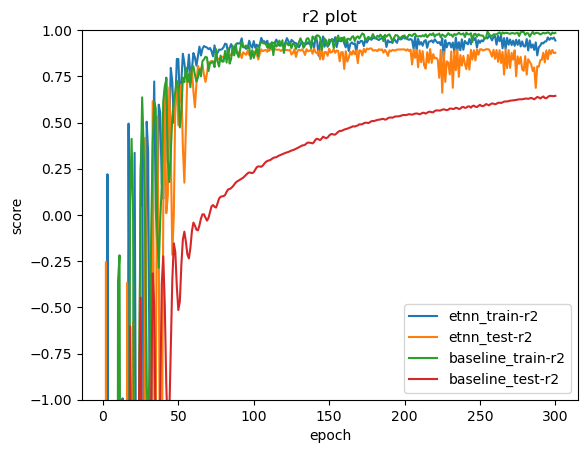

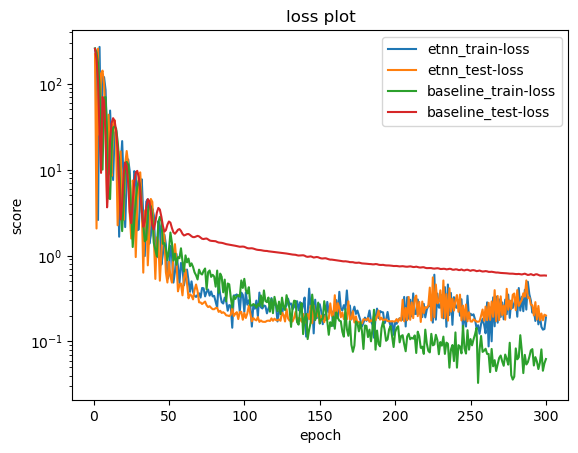

In [11]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

## Dataset size 1000

Rank 1 parameter configuration: Unnamed: 0                                      40
number                                          40
value                                    -0.530088
datetime_start          2023-12-27 16:36:57.798816
datetime_complete       2023-12-27 16:37:05.814596
duration                    0 days 00:00:08.015780
params_batcher                               False
params_hidden_dim                              144
params_k                                         1
params_learning_rate                      0.000023
state                                     COMPLETE
Name: 40, dtype: object
Model params etnn: 57169


100%|██████████| 300/300 [01:40<00:00,  3.00it/s]


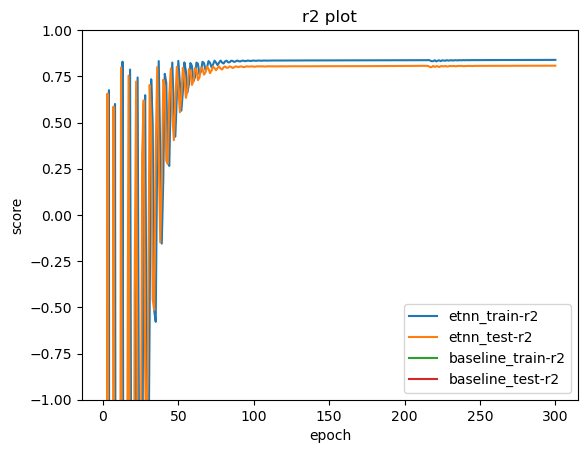

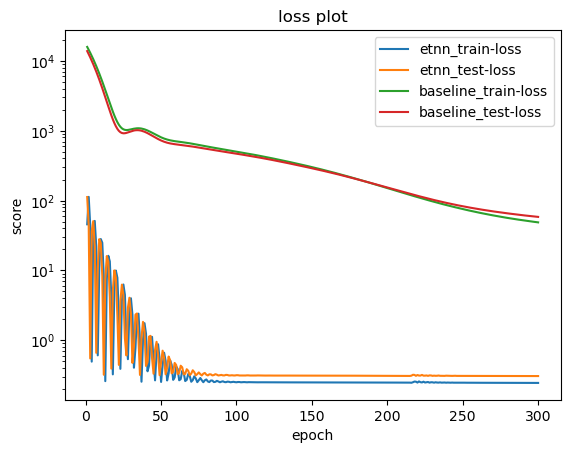

Rank 2 parameter configuration: Unnamed: 0                                      28
number                                          28
value                                    -9.486895
datetime_start          2023-12-27 16:35:14.147933
datetime_complete       2023-12-27 16:35:22.321993
duration                    0 days 00:00:08.174060
params_batcher                               False
params_hidden_dim                              448
params_k                                         1
params_learning_rate                      0.000011
state                                     COMPLETE
Name: 28, dtype: object
Model params etnn: 535361


100%|██████████| 300/300 [01:46<00:00,  2.81it/s]


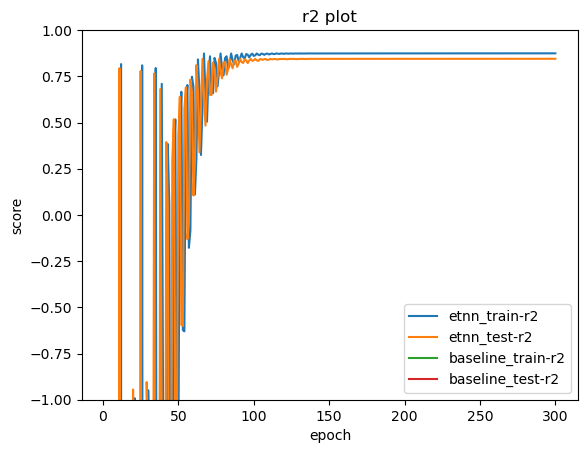

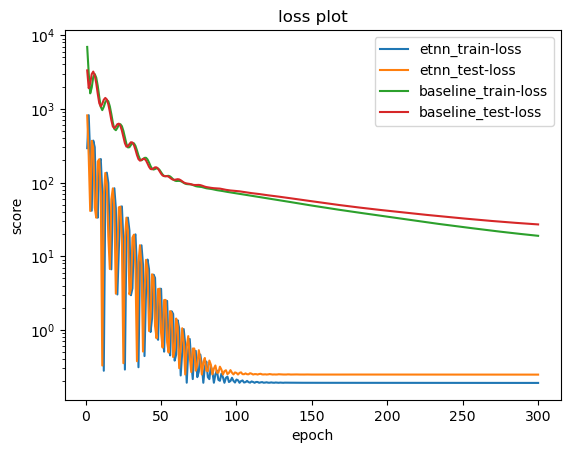

Rank 3 parameter configuration: Unnamed: 0                                      29
number                                          29
value                                   -15.098501
datetime_start          2023-12-27 16:35:22.323992
datetime_complete       2023-12-27 16:35:31.408206
duration                    0 days 00:00:09.084214
params_batcher                               False
params_hidden_dim                              448
params_k                                         1
params_learning_rate                      0.000013
state                                     COMPLETE
Name: 29, dtype: object
Model params etnn: 535361


100%|██████████| 300/300 [01:42<00:00,  2.92it/s]


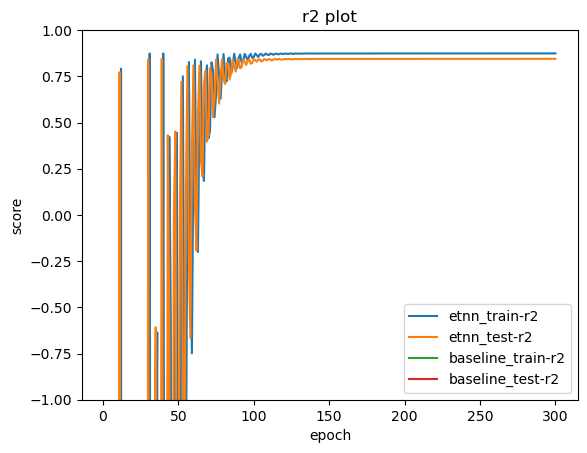

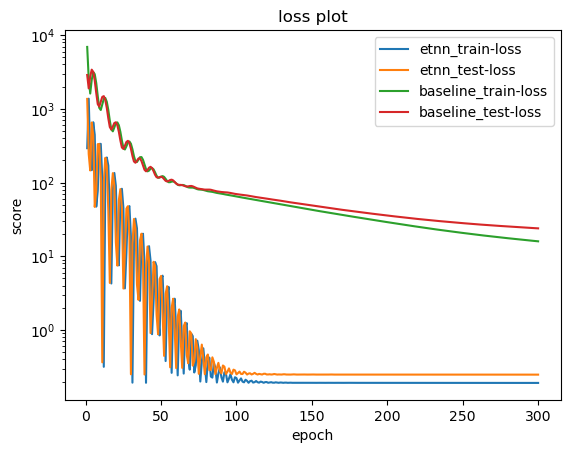

In [12]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                      20
number                                          20
value                                     0.531735
datetime_start          2023-12-27 16:40:48.280298
datetime_complete       2023-12-27 16:40:55.969179
duration                    0 days 00:00:07.688881
params_batcher                                True
params_hidden_dim                              496
params_k                                         3
params_learning_rate                      0.001383
state                                     COMPLETE
Name: 20, dtype: object
Model params etnn: 655217


100%|██████████| 300/300 [01:30<00:00,  3.30it/s]


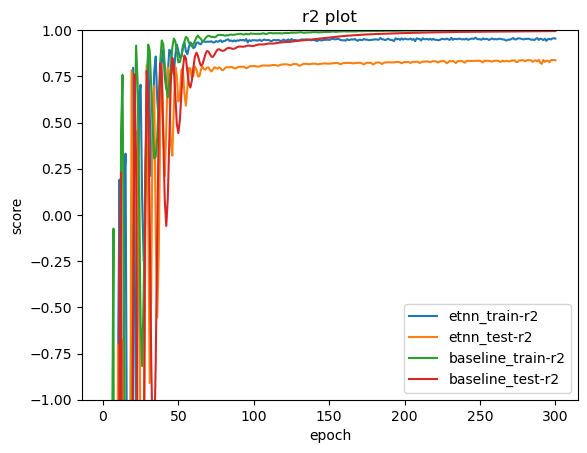

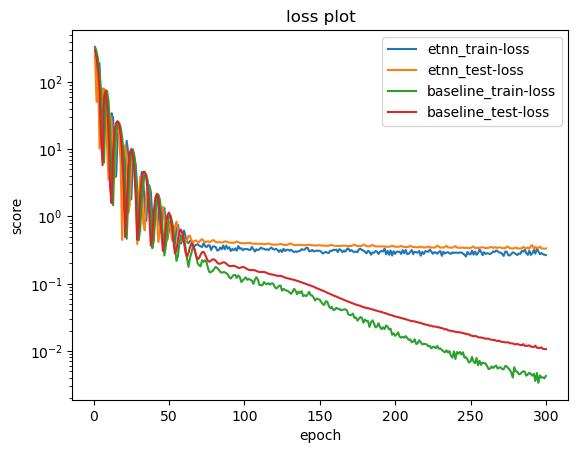

Rank 2 parameter configuration: Unnamed: 0                                      99
number                                          99
value                                     0.449185
datetime_start          2023-12-27 16:49:54.865306
datetime_complete       2023-12-27 16:50:01.573534
duration                    0 days 00:00:06.708228
params_batcher                                True
params_hidden_dim                              352
params_k                                         3
params_learning_rate                      0.002439
state                                     COMPLETE
Name: 99, dtype: object
Model params etnn: 331937


100%|██████████| 300/300 [01:29<00:00,  3.34it/s]


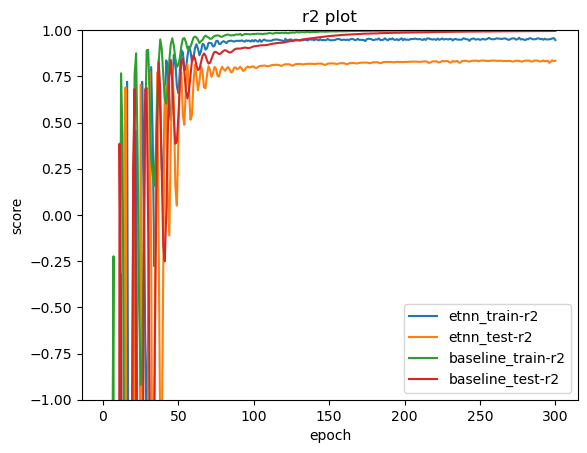

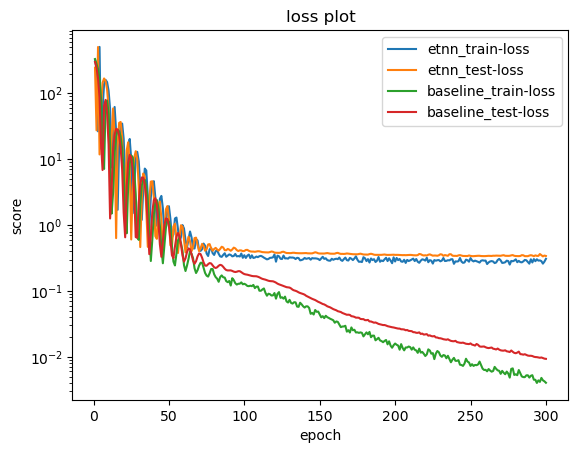

Rank 3 parameter configuration: Unnamed: 0                                      31
number                                          31
value                                     0.415288
datetime_start          2023-12-27 16:42:09.820104
datetime_complete       2023-12-27 16:42:16.820102
duration                    0 days 00:00:06.999998
params_batcher                                True
params_hidden_dim                              240
params_k                                         4
params_learning_rate                      0.002879
state                                     COMPLETE
Name: 31, dtype: object
Model params etnn: 155761


100%|██████████| 300/300 [01:28<00:00,  3.39it/s]


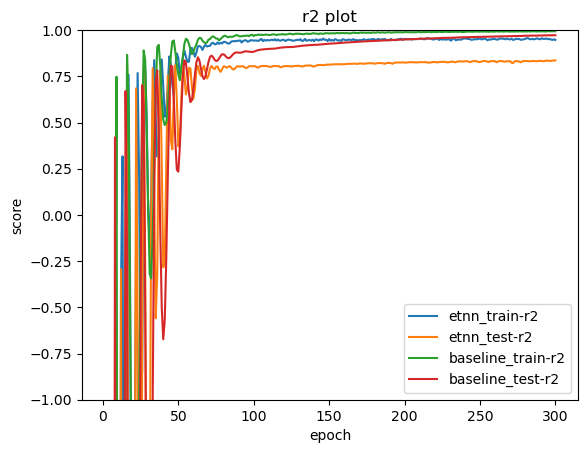

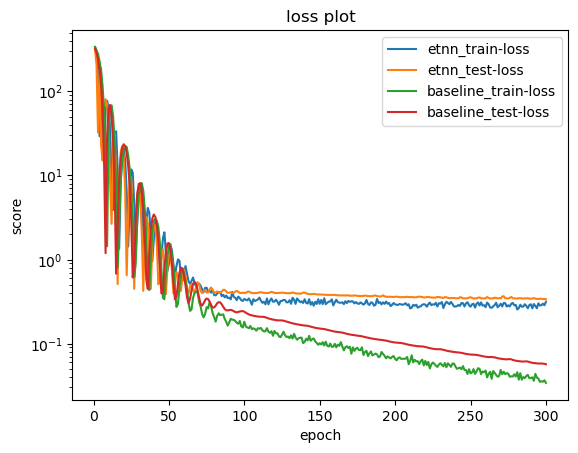

In [13]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     132
number                                         132
value                                     0.505808
datetime_start          2023-12-27 17:11:00.590049
datetime_complete       2023-12-27 17:11:10.213301
duration                    0 days 00:00:09.623252
params_batcher                                True
params_hidden_dim                              464
params_k                                         5
params_learning_rate                      0.001843
state                                     COMPLETE
Name: 132, dtype: object
Model params etnn: 573969


100%|██████████| 300/300 [01:58<00:00,  2.53it/s]


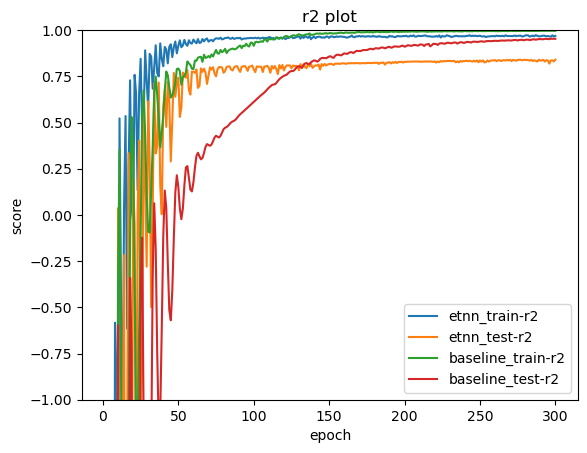

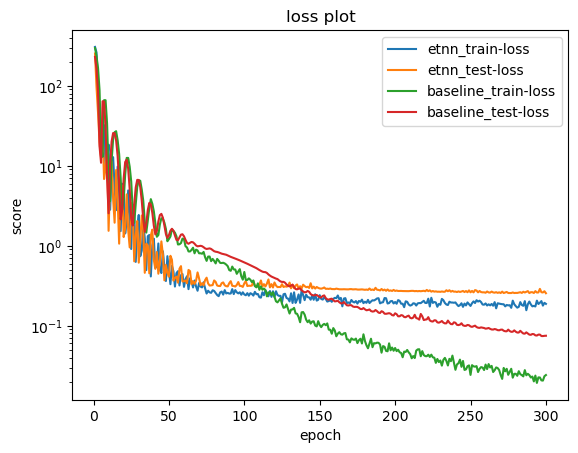

Rank 2 parameter configuration: Unnamed: 0                                     109
number                                         109
value                                     0.491384
datetime_start          2023-12-27 17:07:01.713413
datetime_complete       2023-12-27 17:07:12.208119
duration                    0 days 00:00:10.494706
params_batcher                                True
params_hidden_dim                              448
params_k                                         5
params_learning_rate                      0.001831
state                                     COMPLETE
Name: 109, dtype: object
Model params etnn: 535361


100%|██████████| 300/300 [01:58<00:00,  2.54it/s]


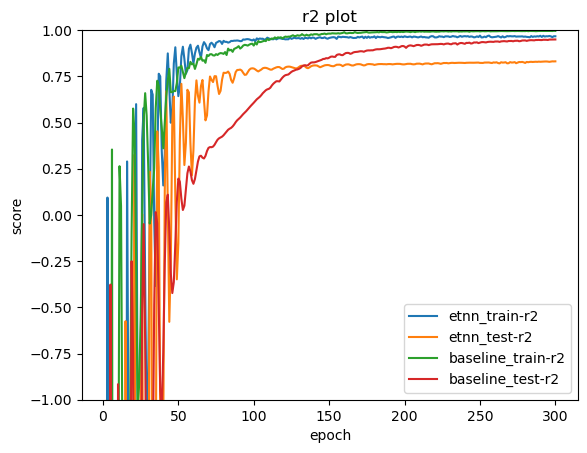

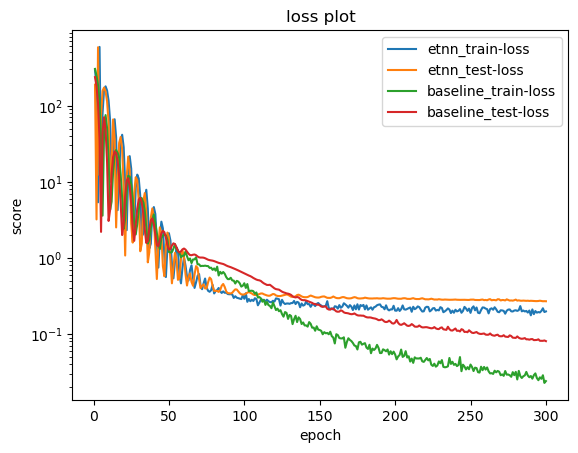

Rank 3 parameter configuration: Unnamed: 0                                     149
number                                         149
value                                     0.456899
datetime_start          2023-12-27 17:13:52.748908
datetime_complete       2023-12-27 17:14:03.155208
duration                    0 days 00:00:10.406300
params_batcher                                True
params_hidden_dim                              368
params_k                                         5
params_learning_rate                      0.003054
state                                     COMPLETE
Name: 149, dtype: object
Model params etnn: 362481


100%|██████████| 300/300 [01:56<00:00,  2.57it/s]


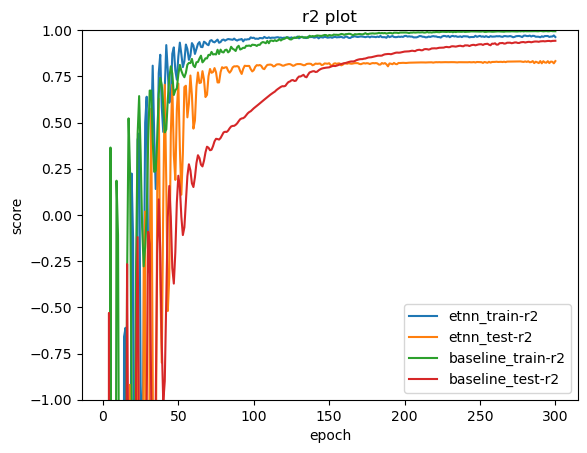

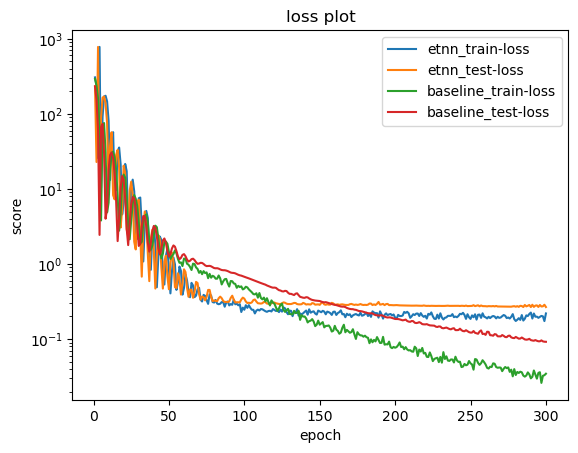

In [14]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

# Q

In [5]:
node_type = "Q"

## Dataset size 10

Rank 1 parameter configuration: Unnamed: 0                                      43
number                                          43
value                                     0.204968
datetime_start          2023-12-27 17:14:17.621165
datetime_complete       2023-12-27 17:14:17.912427
duration                    0 days 00:00:00.291262
params_batcher                                True
params_hidden_dim                               16
params_k                                         5
params_learning_rate                      0.000831
state                                     COMPLETE
Name: 43, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [00:02<00:00, 136.17it/s]


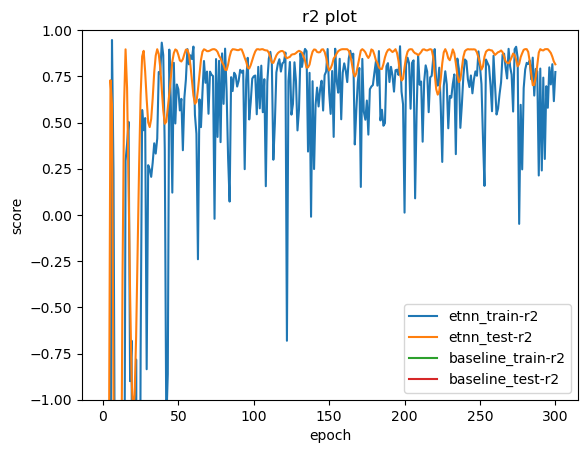

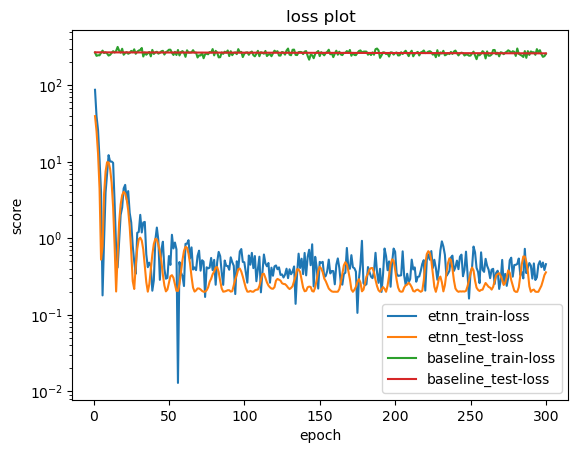

Rank 2 parameter configuration: Unnamed: 0                                      44
number                                          44
value                                    -0.413166
datetime_start          2023-12-27 17:14:17.913427
datetime_complete       2023-12-27 17:14:18.227426
duration                    0 days 00:00:00.313999
params_batcher                               False
params_hidden_dim                               16
params_k                                         5
params_learning_rate                       0.00066
state                                     COMPLETE
Name: 44, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [00:01<00:00, 163.94it/s]


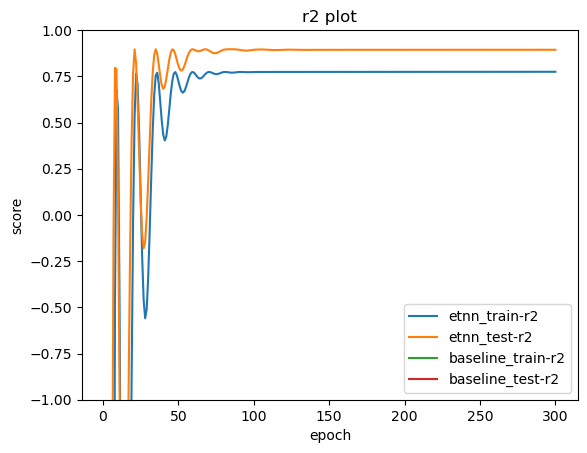

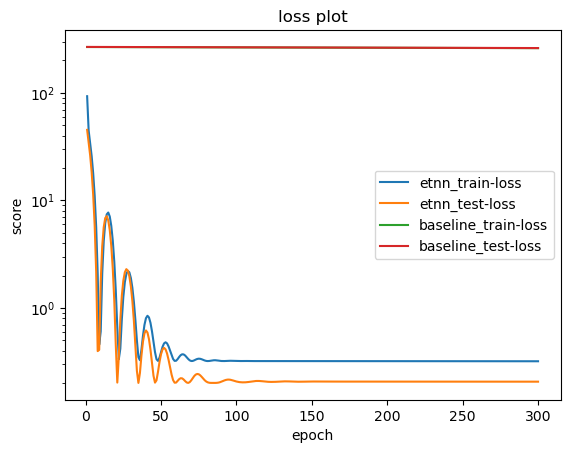

Rank 3 parameter configuration: Unnamed: 0                                      47
number                                          47
value                                    -0.686866
datetime_start          2023-12-27 17:14:18.852546
datetime_complete       2023-12-27 17:14:19.171642
duration                    0 days 00:00:00.319096
params_batcher                               False
params_hidden_dim                               16
params_k                                         5
params_learning_rate                      0.000401
state                                     COMPLETE
Name: 47, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [00:02<00:00, 131.81it/s]


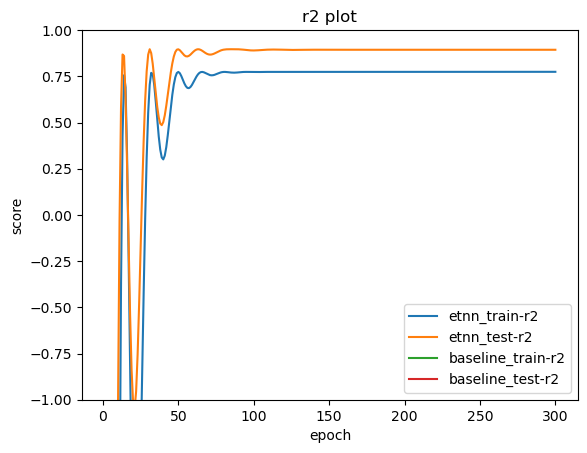

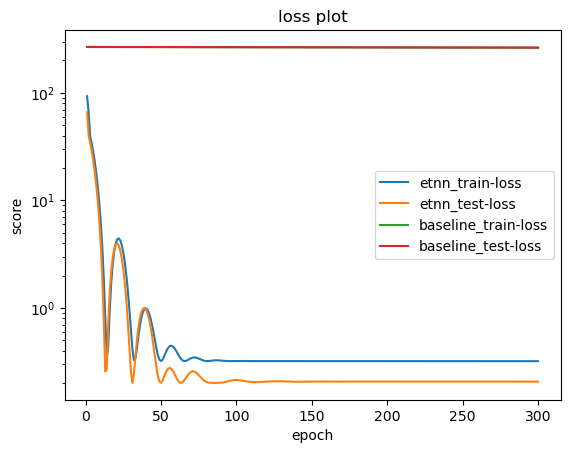

In [16]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     132
number                                         132
value                                    -7.674665
datetime_start          2023-12-27 17:14:58.445260
datetime_complete       2023-12-27 17:14:58.705282
duration                    0 days 00:00:00.260022
params_batcher                                True
params_hidden_dim                              240
params_k                                         4
params_learning_rate                      0.001591
state                                     COMPLETE
Name: 132, dtype: object
Model params etnn: 155761


100%|██████████| 300/300 [00:02<00:00, 124.74it/s]


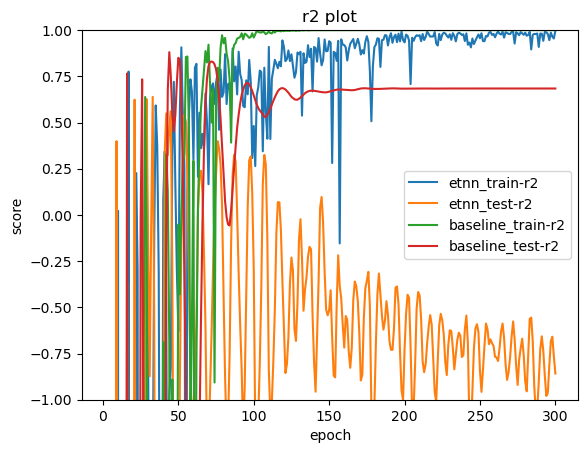

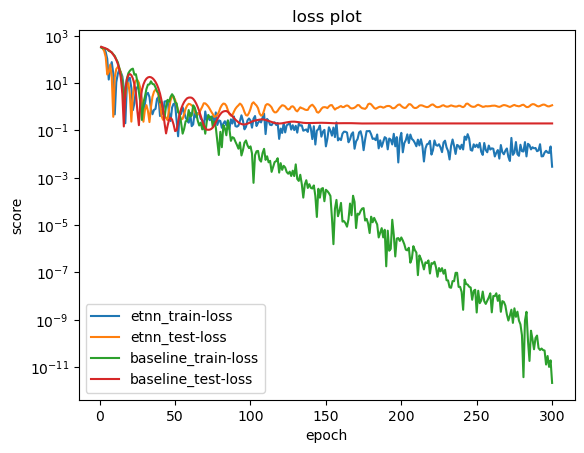

Rank 2 parameter configuration: Unnamed: 0                                      55
number                                          55
value                                     -7.83756
datetime_start          2023-12-27 17:14:37.019848
datetime_complete       2023-12-27 17:14:37.295724
duration                    0 days 00:00:00.275876
params_batcher                                True
params_hidden_dim                              288
params_k                                         5
params_learning_rate                      0.001779
state                                     COMPLETE
Name: 55, dtype: object
Model params etnn: 223201


100%|██████████| 300/300 [00:01<00:00, 161.64it/s]


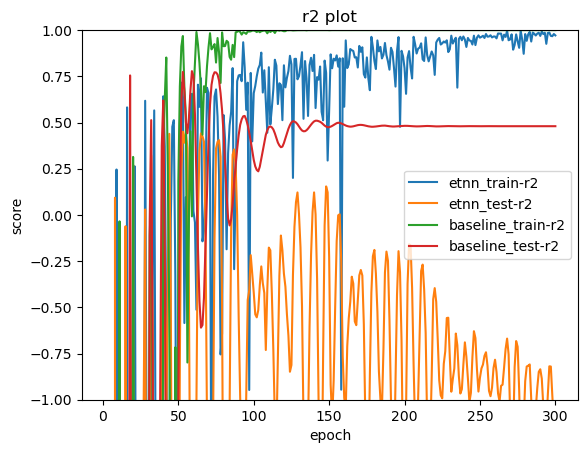

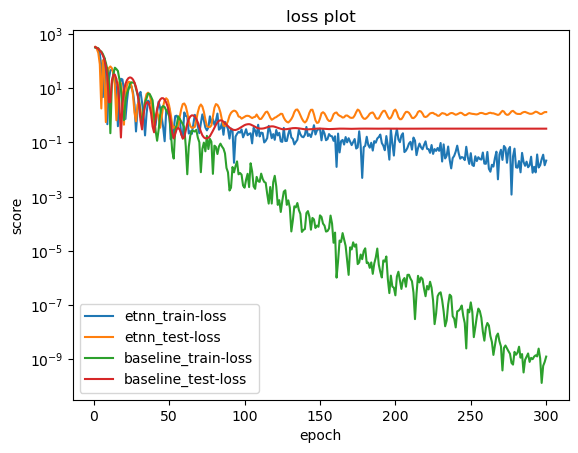

Rank 3 parameter configuration: Unnamed: 0                                     108
number                                         108
value                                    -8.189425
datetime_start          2023-12-27 17:14:51.834055
datetime_complete       2023-12-27 17:14:52.102215
duration                    0 days 00:00:00.268160
params_batcher                                True
params_hidden_dim                              240
params_k                                         4
params_learning_rate                      0.001617
state                                     COMPLETE
Name: 108, dtype: object
Model params etnn: 155761


100%|██████████| 300/300 [00:01<00:00, 156.50it/s]


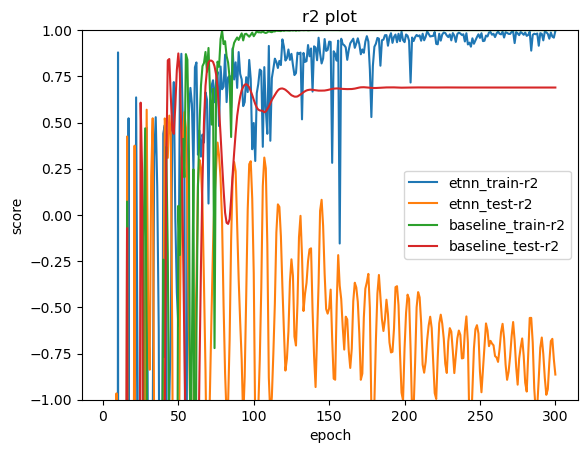

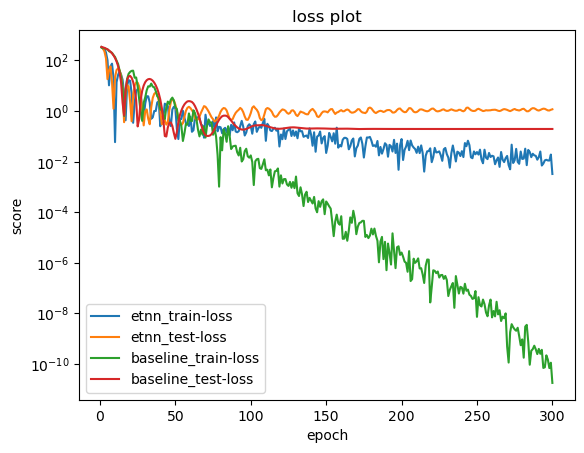

In [17]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     165
number                                         165
value                                     0.649469
datetime_start          2023-12-27 17:16:03.035766
datetime_complete       2023-12-27 17:16:03.269309
duration                    0 days 00:00:00.233543
params_batcher                               False
params_hidden_dim                              432
params_k                                         1
params_learning_rate                      0.002597
state                                     COMPLETE
Name: 165, dtype: object
Model params etnn: 498097


100%|██████████| 300/300 [00:02<00:00, 133.45it/s]


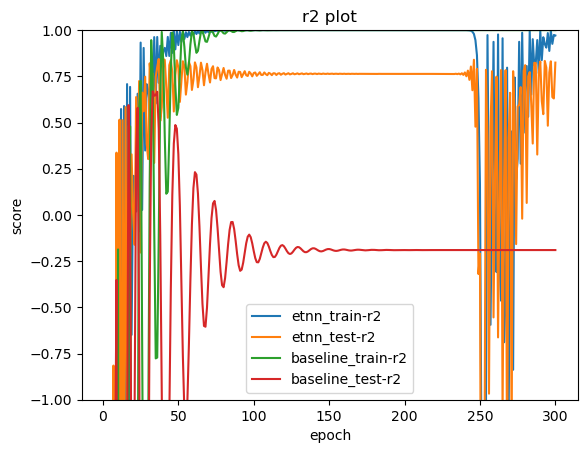

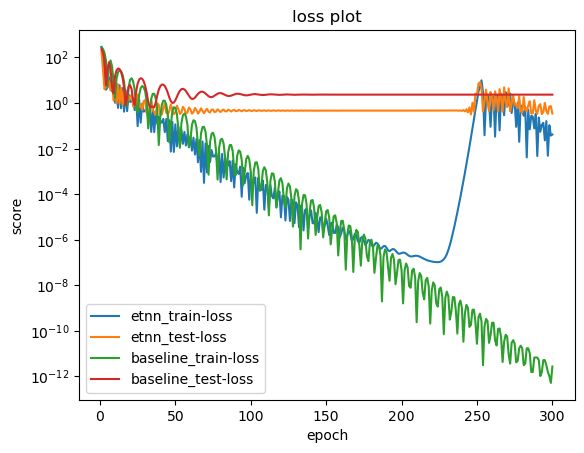

Rank 2 parameter configuration: Unnamed: 0                                     157
number                                         157
value                                     0.430156
datetime_start          2023-12-27 17:16:01.077384
datetime_complete       2023-12-27 17:16:01.349498
duration                    0 days 00:00:00.272114
params_batcher                               False
params_hidden_dim                              416
params_k                                         1
params_learning_rate                      0.004808
state                                     COMPLETE
Name: 157, dtype: object
Model params etnn: 462177


100%|██████████| 300/300 [00:02<00:00, 119.74it/s]


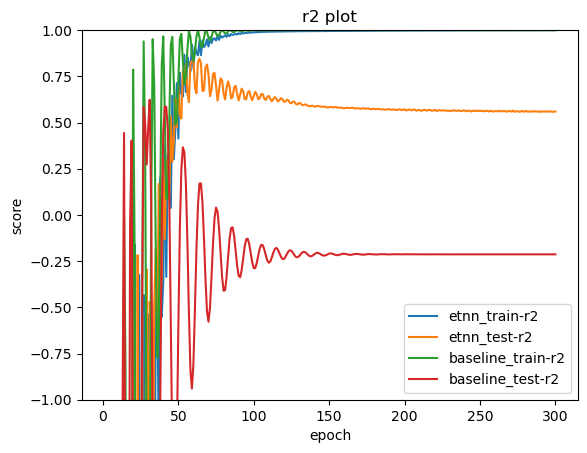

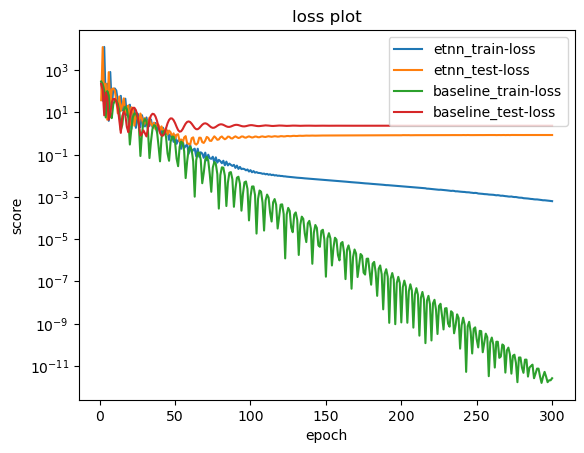

Rank 3 parameter configuration: Unnamed: 0                                     153
number                                         153
value                                     0.427628
datetime_start          2023-12-27 17:16:00.010342
datetime_complete       2023-12-27 17:16:00.270804
duration                    0 days 00:00:00.260462
params_batcher                               False
params_hidden_dim                              400
params_k                                         1
params_learning_rate                      0.002846
state                                     COMPLETE
Name: 153, dtype: object
Model params etnn: 427601


100%|██████████| 300/300 [00:02<00:00, 127.85it/s]


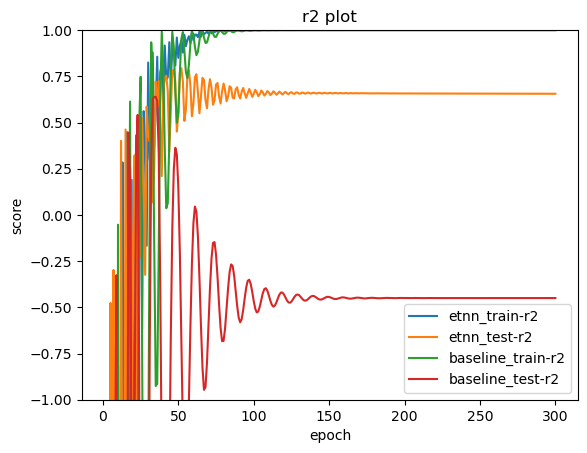

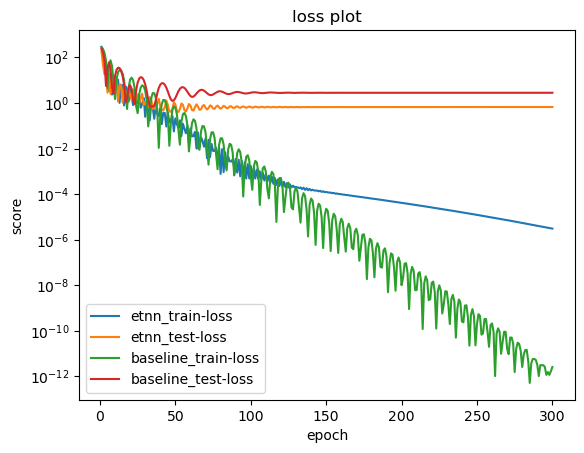

In [18]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

## Dataset size 100

Rank 1 parameter configuration: Unnamed: 0                                      47
number                                          47
value                                   -13.583381
datetime_start          2023-12-27 17:17:03.144582
datetime_complete       2023-12-27 17:17:03.995129
duration                    0 days 00:00:00.850547
params_batcher                                True
params_hidden_dim                               16
params_k                                         1
params_learning_rate                      0.000072
state                                     COMPLETE
Name: 47, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [00:11<00:00, 25.80it/s]


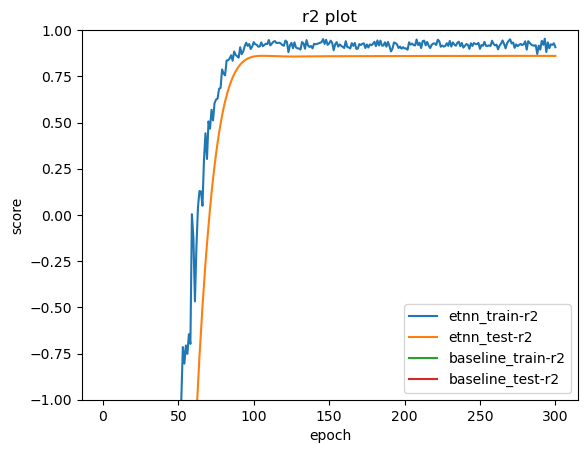

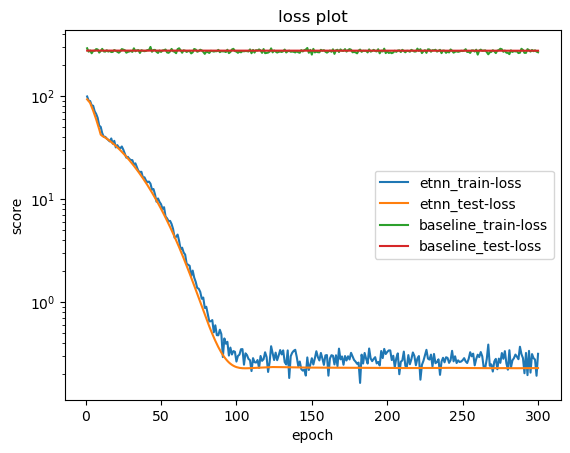

Rank 2 parameter configuration: Unnamed: 0                                      29
number                                          29
value                                   -20.297088
datetime_start          2023-12-27 17:16:45.159169
datetime_complete       2023-12-27 17:16:46.279285
duration                    0 days 00:00:01.120116
params_batcher                                True
params_hidden_dim                              224
params_k                                         3
params_learning_rate                      0.000019
state                                     COMPLETE
Name: 29, dtype: object
Model params etnn: 135969


100%|██████████| 300/300 [00:11<00:00, 25.07it/s]


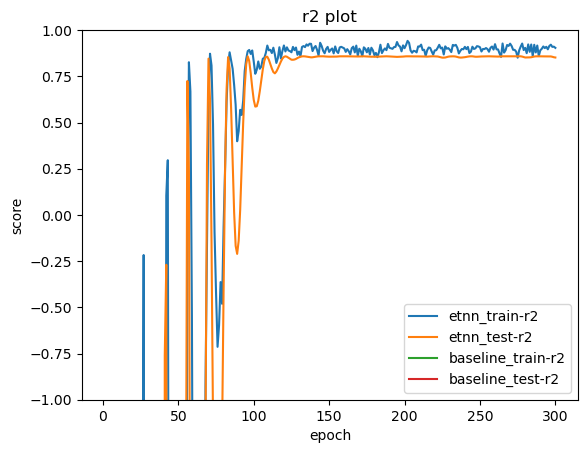

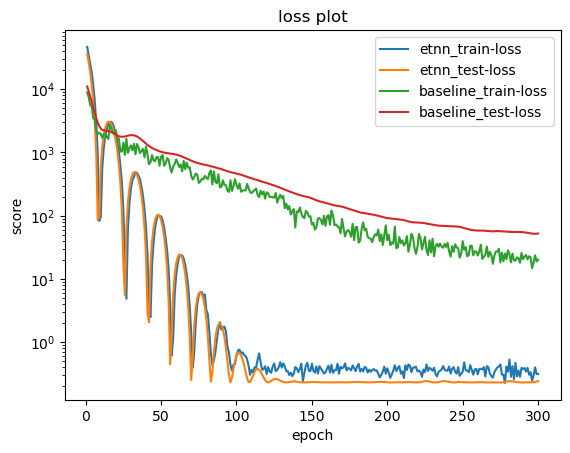

Rank 3 parameter configuration: Unnamed: 0                                      31
number                                          31
value                                   -20.400504
datetime_start          2023-12-27 17:16:47.499279
datetime_complete       2023-12-27 17:16:48.342276
duration                    0 days 00:00:00.842997
params_batcher                                True
params_hidden_dim                              224
params_k                                         3
params_learning_rate                      0.000019
state                                     COMPLETE
Name: 31, dtype: object
Model params etnn: 135969


100%|██████████| 300/300 [00:11<00:00, 25.61it/s]


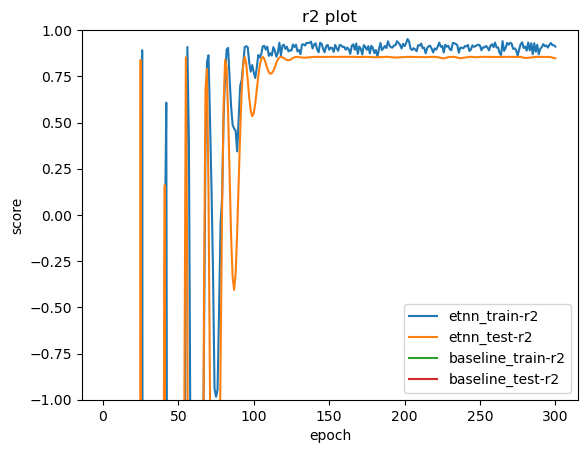

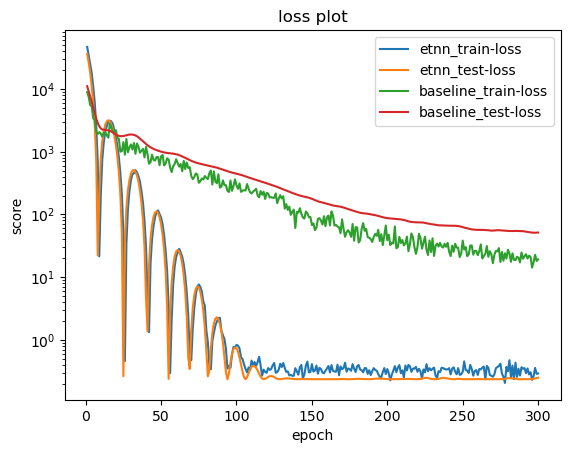

In [19]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     111
number                                         111
value                                     0.594537
datetime_start          2023-12-27 17:18:54.121710
datetime_complete       2023-12-27 17:18:55.256439
duration                    0 days 00:00:01.134729
params_batcher                                True
params_hidden_dim                              496
params_k                                         4
params_learning_rate                      0.001763
state                                     COMPLETE
Name: 111, dtype: object
Model params etnn: 655217


100%|██████████| 300/300 [00:10<00:00, 28.46it/s]


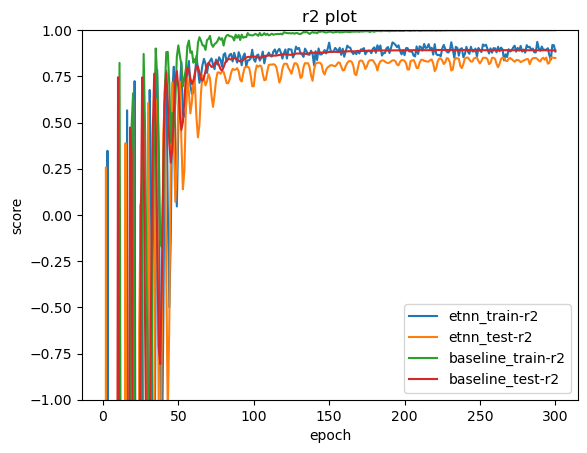

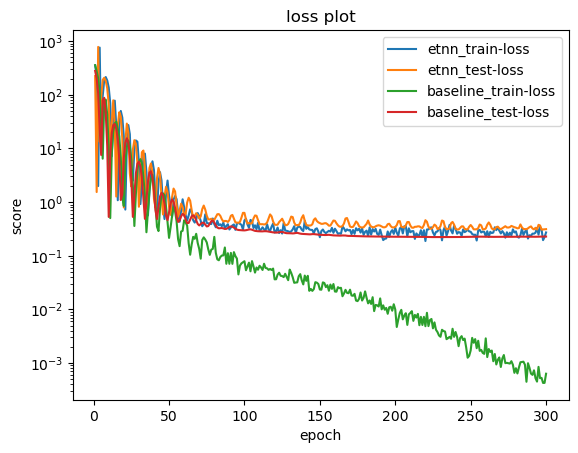

Rank 2 parameter configuration: Unnamed: 0                                      32
number                                          32
value                                     0.594231
datetime_start          2023-12-27 17:17:38.502523
datetime_complete       2023-12-27 17:17:39.435435
duration                    0 days 00:00:00.932912
params_batcher                                True
params_hidden_dim                              352
params_k                                         3
params_learning_rate                       0.00245
state                                     COMPLETE
Name: 32, dtype: object
Model params etnn: 331937


100%|██████████| 300/300 [00:10<00:00, 29.35it/s]


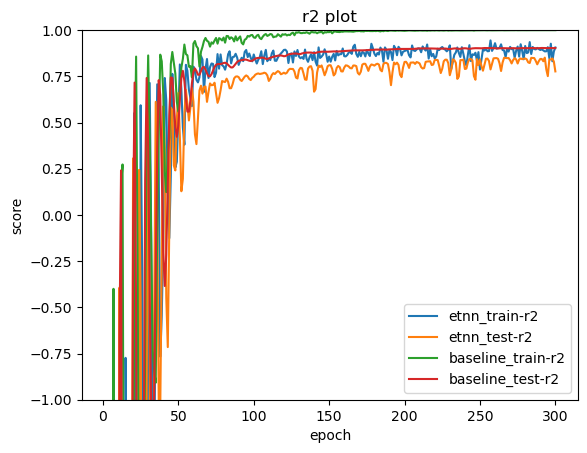

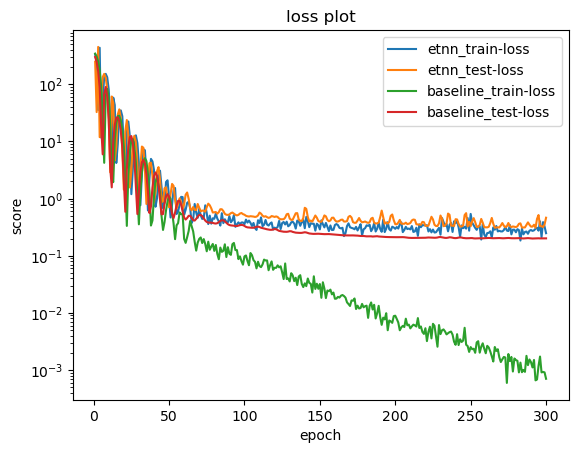

Rank 3 parameter configuration: Unnamed: 0                                      78
number                                          78
value                                     0.594109
datetime_start          2023-12-27 17:18:22.686962
datetime_complete       2023-12-27 17:18:23.685314
duration                    0 days 00:00:00.998352
params_batcher                                True
params_hidden_dim                              288
params_k                                         5
params_learning_rate                      0.002773
state                                     COMPLETE
Name: 78, dtype: object
Model params etnn: 223201


100%|██████████| 300/300 [00:10<00:00, 28.92it/s]


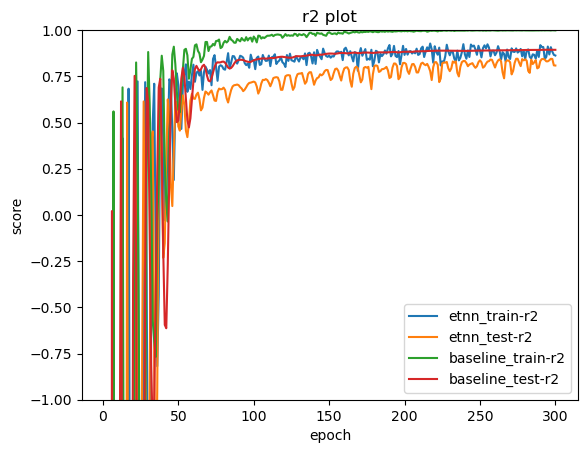

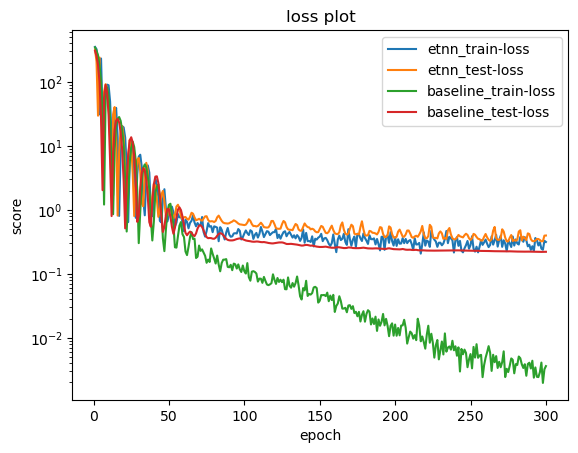

In [20]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                      99
number                                          99
value                                     0.655077
datetime_start          2023-12-27 17:22:16.523032
datetime_complete       2023-12-27 17:22:17.770532
duration                    0 days 00:00:01.247500
params_batcher                               False
params_hidden_dim                              320
params_k                                         4
params_learning_rate                       0.00472
state                                     COMPLETE
Name: 99, dtype: object
Model params etnn: 274881


100%|██████████| 300/300 [00:13<00:00, 22.88it/s]


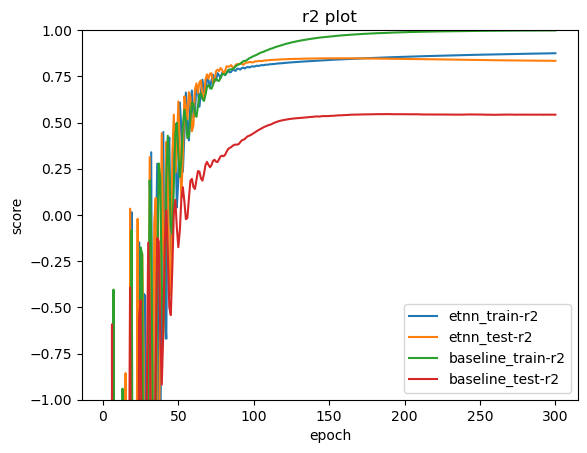

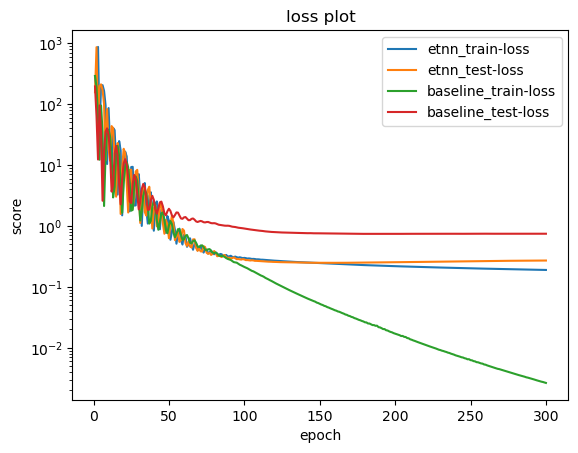

Rank 2 parameter configuration: Unnamed: 0                                      65
number                                          65
value                                     0.587203
datetime_start          2023-12-27 17:21:34.235354
datetime_complete       2023-12-27 17:21:35.530041
duration                    0 days 00:00:01.294687
params_batcher                                True
params_hidden_dim                              464
params_k                                         5
params_learning_rate                      0.001735
state                                     COMPLETE
Name: 65, dtype: object
Model params etnn: 573969


100%|██████████| 300/300 [00:13<00:00, 21.94it/s]


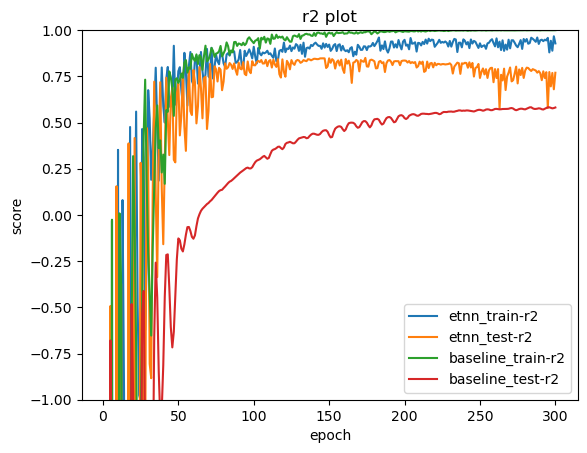

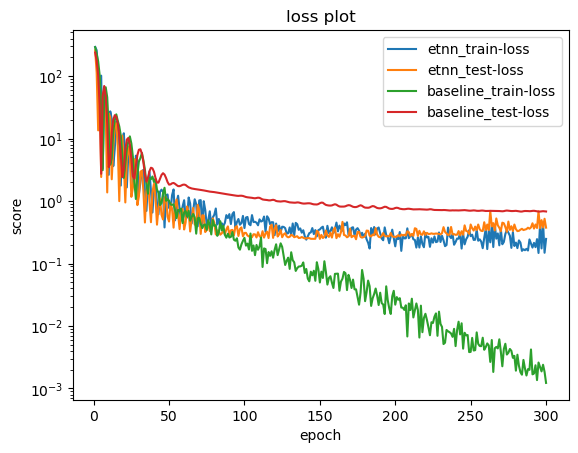

Rank 3 parameter configuration: Unnamed: 0                                     145
number                                         145
value                                      0.55702
datetime_start          2023-12-27 17:23:14.545648
datetime_complete       2023-12-27 17:23:15.834643
duration                    0 days 00:00:01.288995
params_batcher                                True
params_hidden_dim                              480
params_k                                         5
params_learning_rate                      0.002185
state                                     COMPLETE
Name: 145, dtype: object
Model params etnn: 613921


100%|██████████| 300/300 [00:13<00:00, 22.61it/s]


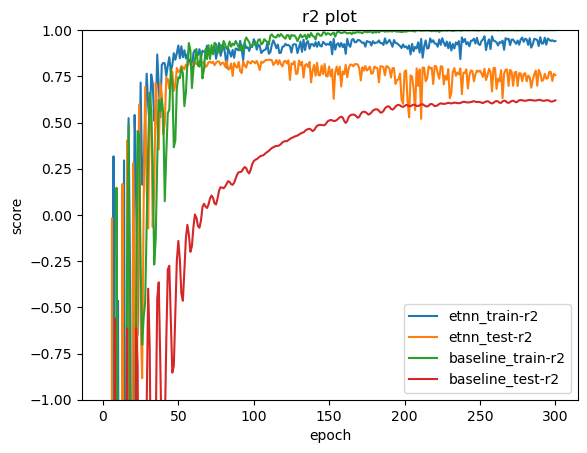

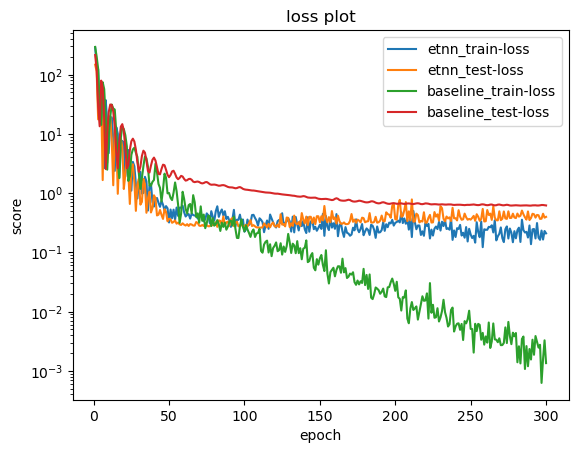

In [21]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

## Dataset size 1000

Rank 1 parameter configuration: Unnamed: 0                                       1
number                                           1
value                                    -5.299647
datetime_start          2023-12-27 17:24:37.983567
datetime_complete       2023-12-27 17:24:46.610374
duration                    0 days 00:00:08.626807
params_batcher                                True
params_hidden_dim                              384
params_k                                         5
params_learning_rate                      0.006183
state                                     COMPLETE
Name: 1, dtype: object
Model params etnn: 394369


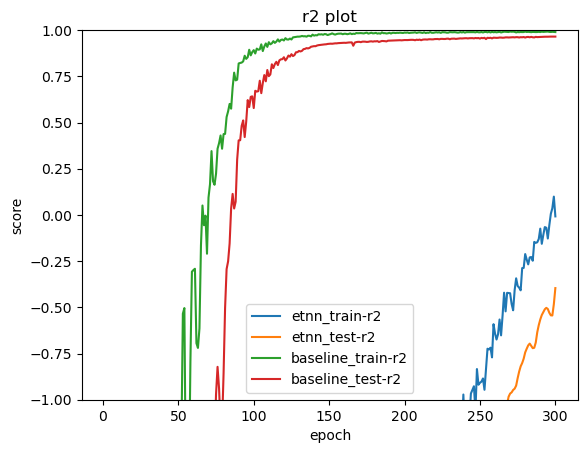

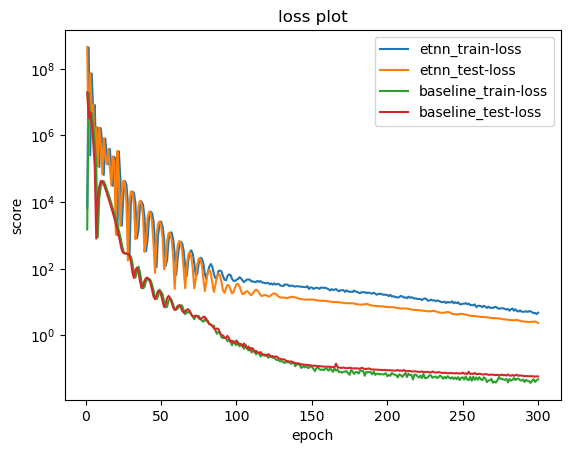

Rank 2 parameter configuration: Unnamed: 0                                      34
number                                          34
value                                   -10.067594
datetime_start          2023-12-27 17:29:15.331637
datetime_complete       2023-12-27 17:29:22.992497
duration                    0 days 00:00:07.660860
params_batcher                               False
params_hidden_dim                               16
params_k                                         5
params_learning_rate                       0.00022
state                                     COMPLETE
Name: 34, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [01:40<00:00,  2.99it/s]


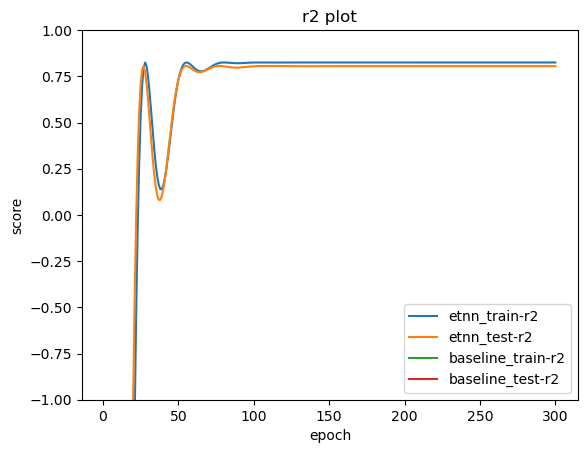

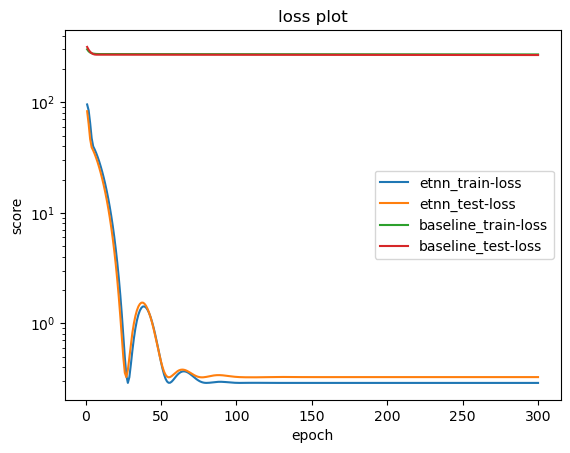

Rank 3 parameter configuration: Unnamed: 0                                      26
number                                          26
value                                   -10.861158
datetime_start          2023-12-27 17:28:11.486638
datetime_complete       2023-12-27 17:28:19.267949
duration                    0 days 00:00:07.781311
params_batcher                               False
params_hidden_dim                               16
params_k                                         5
params_learning_rate                      0.000032
state                                     COMPLETE
Name: 26, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [01:40<00:00,  2.98it/s]


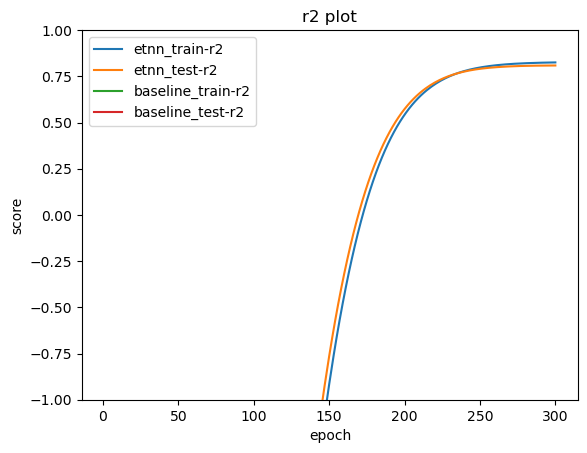

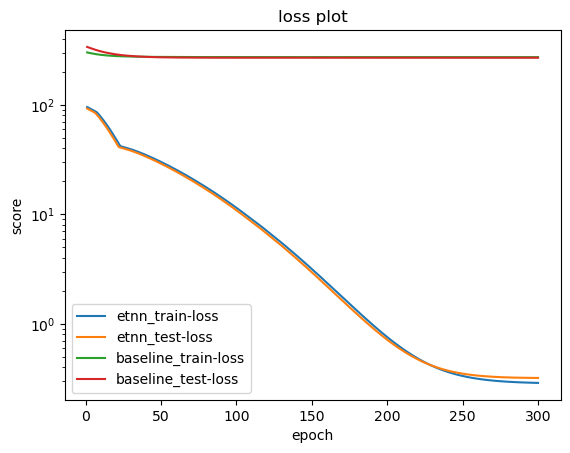

In [23]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                      64
number                                          64
value                                      0.56964
datetime_start          2023-12-27 17:39:15.138816
datetime_complete       2023-12-27 17:39:22.286162
duration                    0 days 00:00:07.147346
params_batcher                                True
params_hidden_dim                              208
params_k                                         2
params_learning_rate                      0.005354
state                                     COMPLETE
Name: 64, dtype: object
Model params etnn: 117521


100%|██████████| 300/300 [01:25<00:00,  3.49it/s]


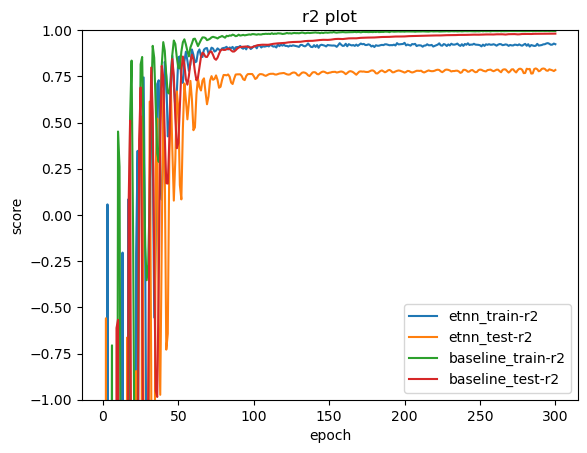

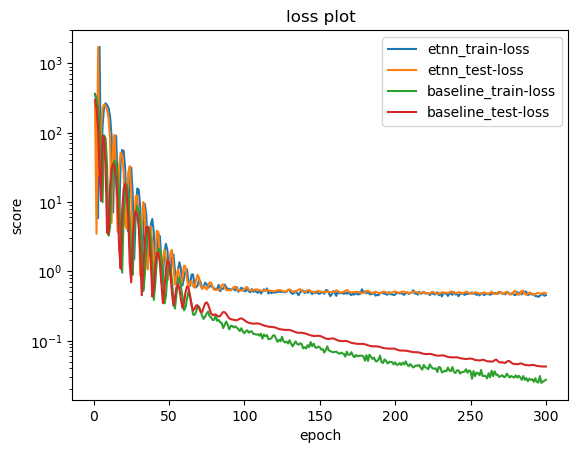

Rank 2 parameter configuration: Unnamed: 0                                      73
number                                          73
value                                     0.438525
datetime_start          2023-12-27 17:40:20.277114
datetime_complete       2023-12-27 17:40:27.750001
duration                    0 days 00:00:07.472887
params_batcher                                True
params_hidden_dim                              176
params_k                                         2
params_learning_rate                      0.005018
state                                     COMPLETE
Name: 73, dtype: object
Model params etnn: 84657


100%|██████████| 300/300 [01:26<00:00,  3.47it/s]


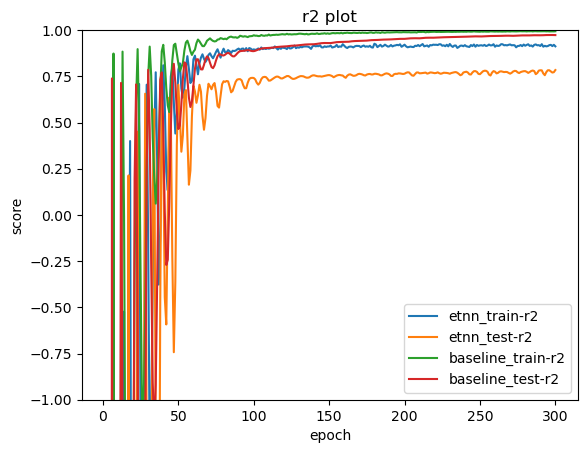

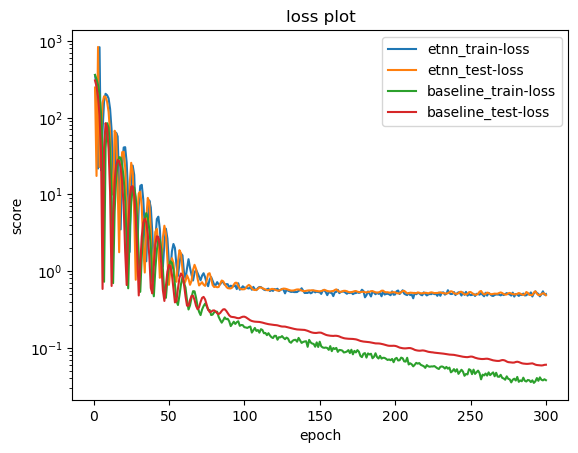

Rank 3 parameter configuration: Unnamed: 0                                      99
number                                          99
value                                      0.24604
datetime_start          2023-12-27 17:43:37.350772
datetime_complete       2023-12-27 17:43:44.668236
duration                    0 days 00:00:07.317464
params_batcher                                True
params_hidden_dim                              256
params_k                                         2
params_learning_rate                      0.002679
state                                     COMPLETE
Name: 99, dtype: object
Model params etnn: 176897


100%|██████████| 300/300 [01:26<00:00,  3.47it/s]


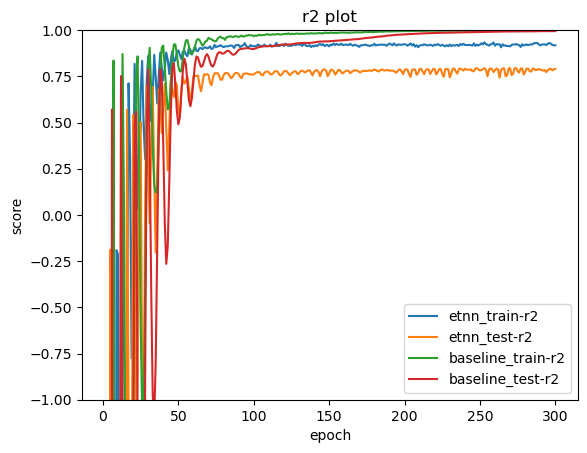

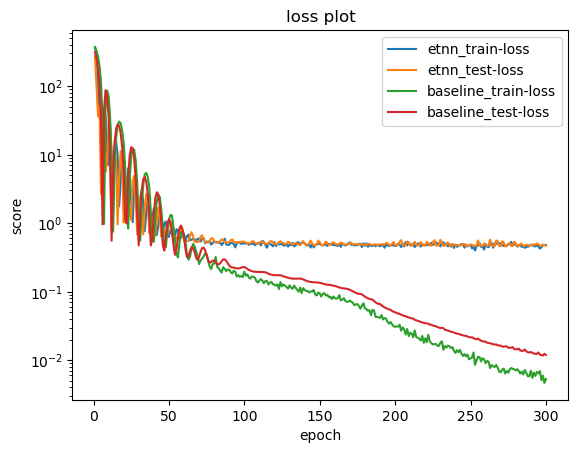

In [6]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                      83
number                                          83
value                                     0.575424
datetime_start          2023-12-27 17:57:21.662840
datetime_complete       2023-12-27 17:57:31.508456
duration                    0 days 00:00:09.845616
params_batcher                                True
params_hidden_dim                              208
params_k                                         3
params_learning_rate                       0.00471
state                                     COMPLETE
Name: 83, dtype: object
Model params etnn: 117521


100%|██████████| 300/300 [01:54<00:00,  2.62it/s]


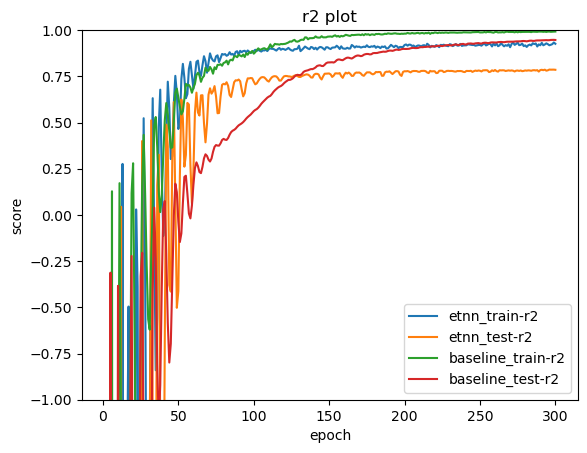

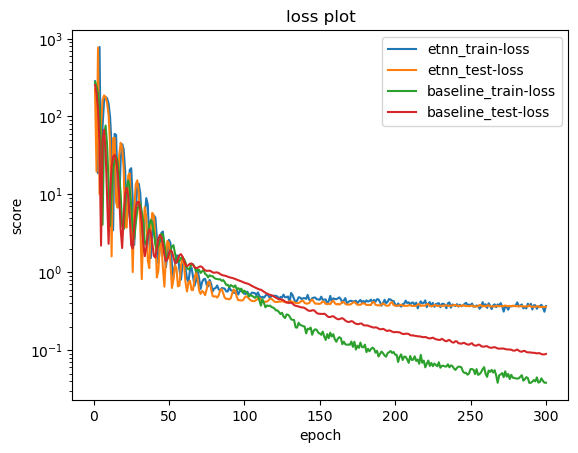

Rank 2 parameter configuration: Unnamed: 0                                     108
number                                         108
value                                     0.523366
datetime_start          2023-12-27 18:01:29.638986
datetime_complete       2023-12-27 18:01:40.221302
duration                    0 days 00:00:10.582316
params_batcher                                True
params_hidden_dim                              288
params_k                                         3
params_learning_rate                      0.002602
state                                     COMPLETE
Name: 108, dtype: object
Model params etnn: 223201


100%|██████████| 300/300 [02:02<00:00,  2.46it/s]


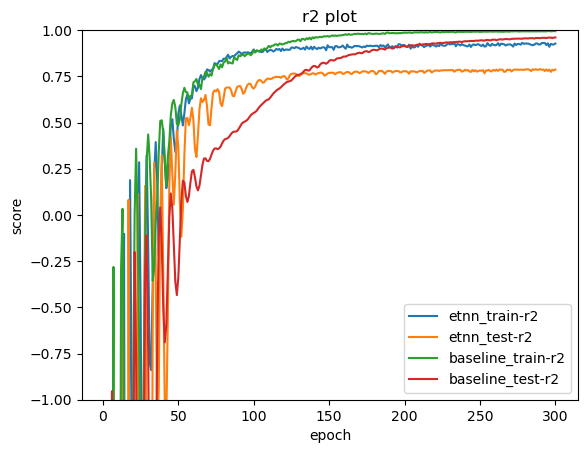

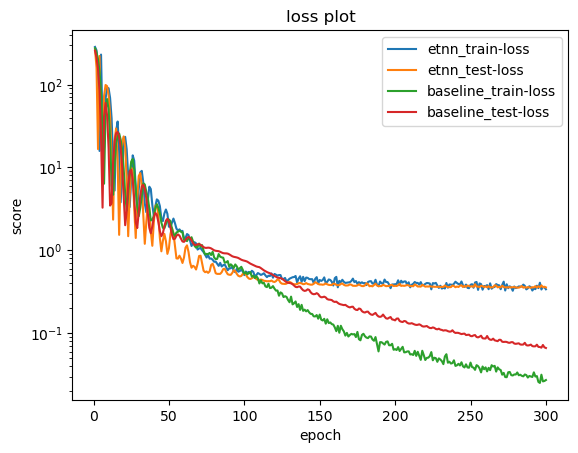

Rank 3 parameter configuration: Unnamed: 0                                      66
number                                          66
value                                     0.483335
datetime_start          2023-12-27 17:54:35.712964
datetime_complete       2023-12-27 17:54:45.665311
duration                    0 days 00:00:09.952347
params_batcher                                True
params_hidden_dim                              208
params_k                                         2
params_learning_rate                      0.005133
state                                     COMPLETE
Name: 66, dtype: object
Model params etnn: 117521


100%|██████████| 300/300 [01:58<00:00,  2.53it/s]


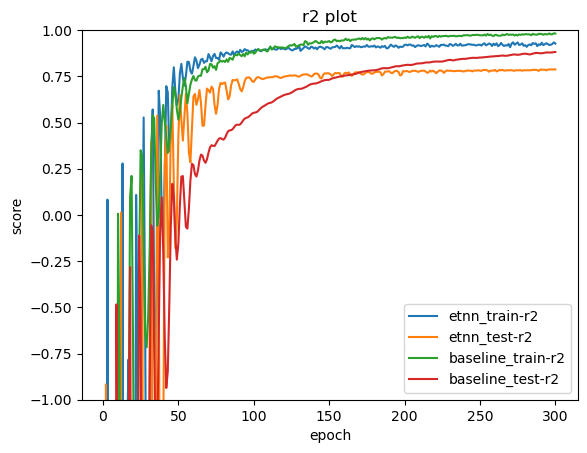

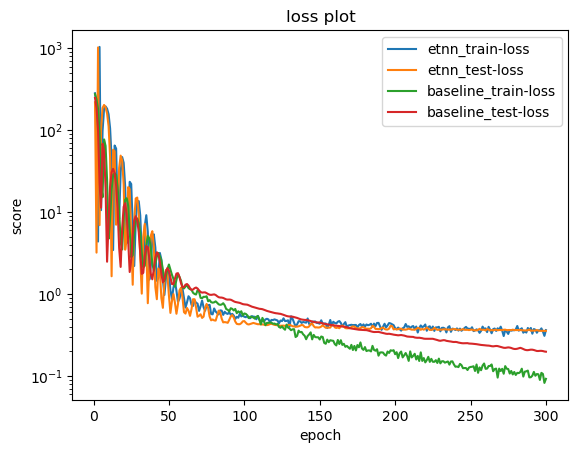

In [7]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

# C

In [8]:
node_type = "C"

## Dataset size 10

Rank 1 parameter configuration: Unnamed: 0                                      44
number                                          44
value                                     0.623598
datetime_start          2023-12-27 18:08:27.616370
datetime_complete       2023-12-27 18:08:27.892375
duration                    0 days 00:00:00.276005
params_batcher                               False
params_hidden_dim                               16
params_k                                         1
params_learning_rate                      0.009791
state                                     COMPLETE
Name: 44, dtype: object
Model params etnn: 977


100%|██████████| 300/300 [00:02<00:00, 115.88it/s]


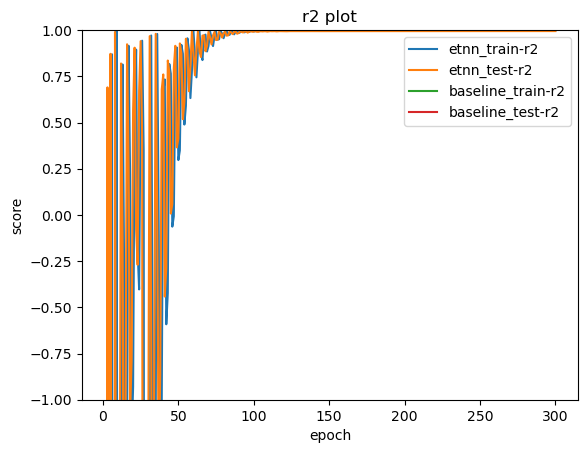

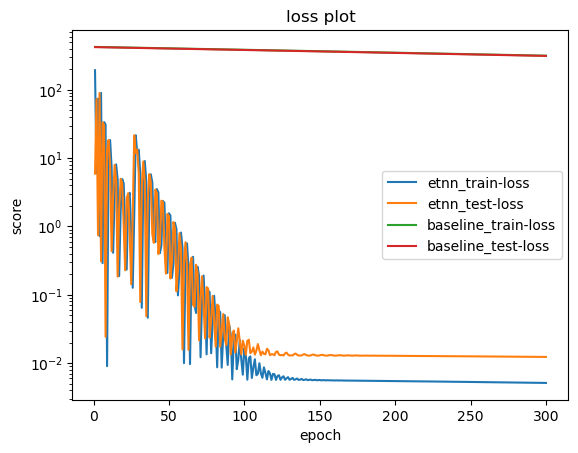

Rank 2 parameter configuration: Unnamed: 0                                      10
number                                          10
value                                    -6.109784
datetime_start          2023-12-27 18:08:17.003124
datetime_complete       2023-12-27 18:08:17.306971
duration                    0 days 00:00:00.303847
params_batcher                               False
params_hidden_dim                               32
params_k                                         4
params_learning_rate                      0.009055
state                                     COMPLETE
Name: 10, dtype: object
Model params etnn: 3297


100%|██████████| 300/300 [00:02<00:00, 118.15it/s]


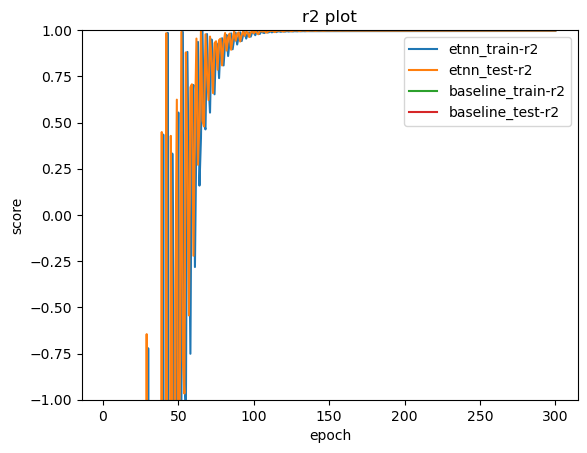

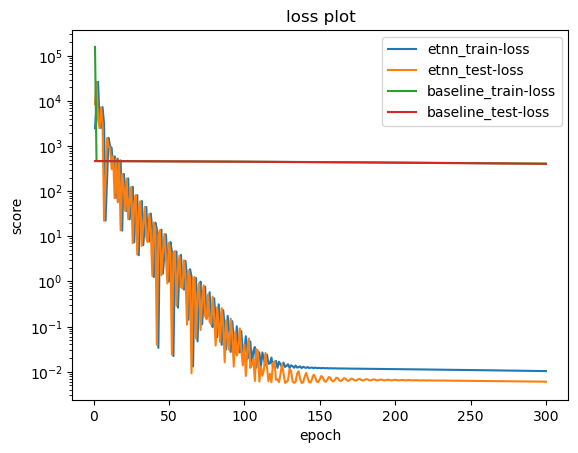

Rank 3 parameter configuration: Unnamed: 0                                      47
number                                          47
value                                    -7.549913
datetime_start          2023-12-27 18:08:28.419793
datetime_complete       2023-12-27 18:08:28.644938
duration                    0 days 00:00:00.225145
params_batcher                               False
params_hidden_dim                               32
params_k                                         1
params_learning_rate                      0.004507
state                                     COMPLETE
Name: 47, dtype: object
Model params etnn: 3297


100%|██████████| 300/300 [00:02<00:00, 119.82it/s]


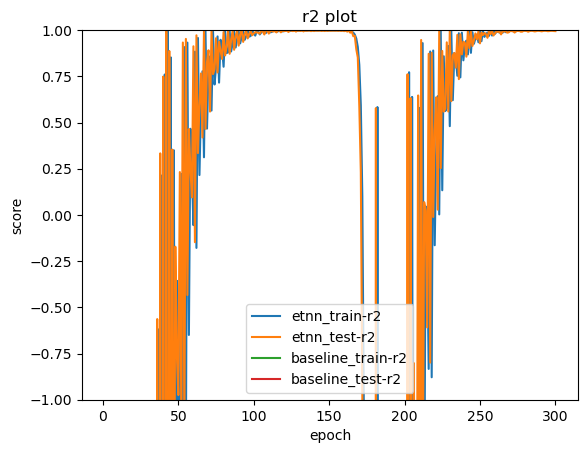

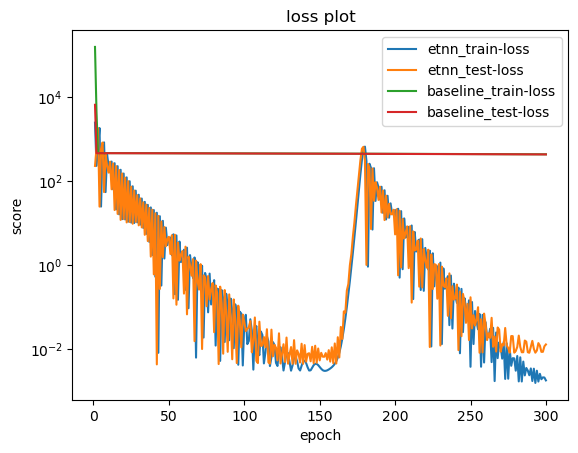

In [9]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     182
number                                         182
value                                    -0.497119
datetime_start          2023-12-27 18:09:28.467968
datetime_complete       2023-12-27 18:09:28.719117
duration                    0 days 00:00:00.251149
params_batcher                               False
params_hidden_dim                              368
params_k                                         3
params_learning_rate                      0.001728
state                                     COMPLETE
Name: 182, dtype: object
Model params etnn: 362481


100%|██████████| 300/300 [00:02<00:00, 113.55it/s]


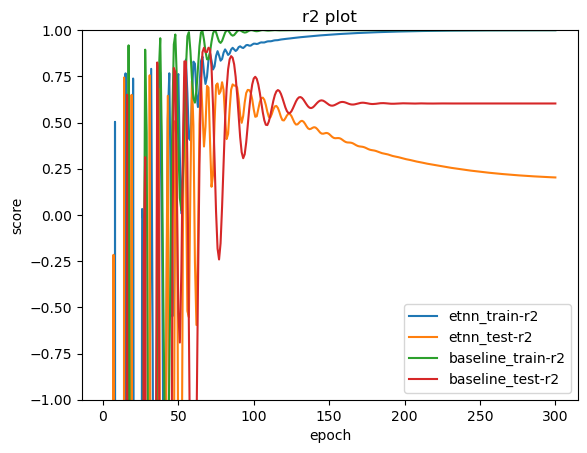

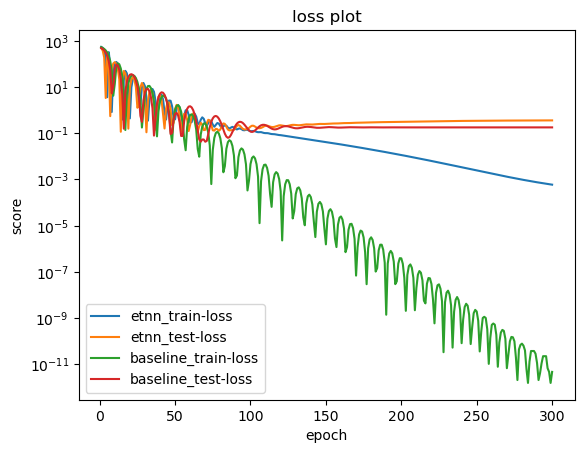

Rank 2 parameter configuration: Unnamed: 0                                     147
number                                         147
value                                    -0.677756
datetime_start          2023-12-27 18:09:18.488409
datetime_complete       2023-12-27 18:09:18.768934
duration                    0 days 00:00:00.280525
params_batcher                               False
params_hidden_dim                              304
params_k                                         3
params_learning_rate                      0.001922
state                                     COMPLETE
Name: 147, dtype: object
Model params etnn: 248369


100%|██████████| 300/300 [00:02<00:00, 118.42it/s]


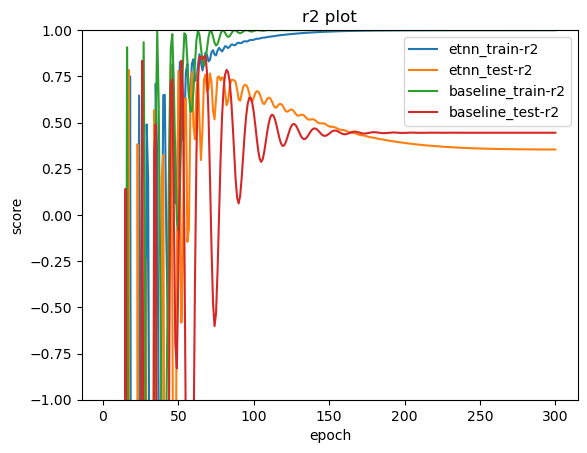

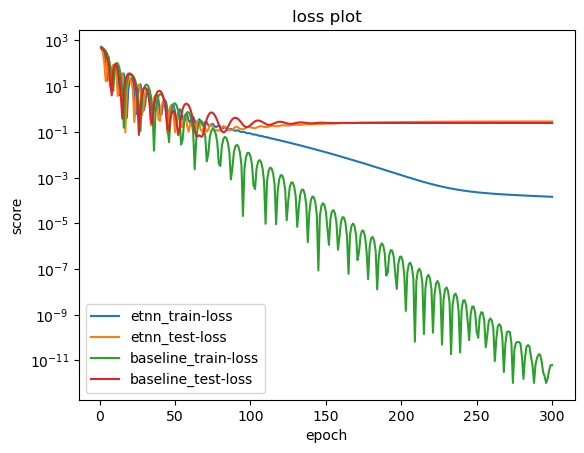

Rank 3 parameter configuration: Unnamed: 0                                     143
number                                         143
value                                    -0.681201
datetime_start          2023-12-27 18:09:17.171855
datetime_complete       2023-12-27 18:09:17.453402
duration                    0 days 00:00:00.281547
params_batcher                               False
params_hidden_dim                              368
params_k                                         3
params_learning_rate                      0.000858
state                                     COMPLETE
Name: 143, dtype: object
Model params etnn: 362481


100%|██████████| 300/300 [00:02<00:00, 147.35it/s]


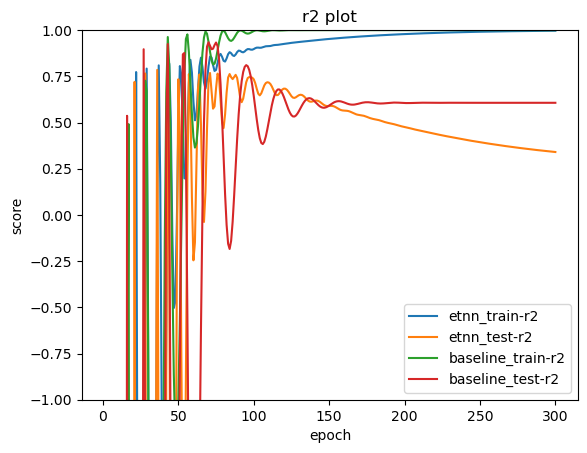

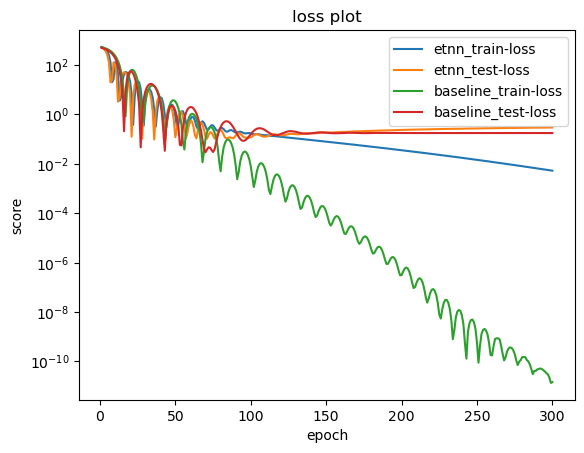

In [10]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     180
number                                         180
value                                     0.312927
datetime_start          2023-12-27 18:10:36.067544
datetime_complete       2023-12-27 18:10:36.466940
duration                    0 days 00:00:00.399396
params_batcher                               False
params_hidden_dim                              400
params_k                                         5
params_learning_rate                      0.000691
state                                     COMPLETE
Name: 180, dtype: object
Model params etnn: 427601


100%|██████████| 300/300 [00:02<00:00, 112.27it/s]


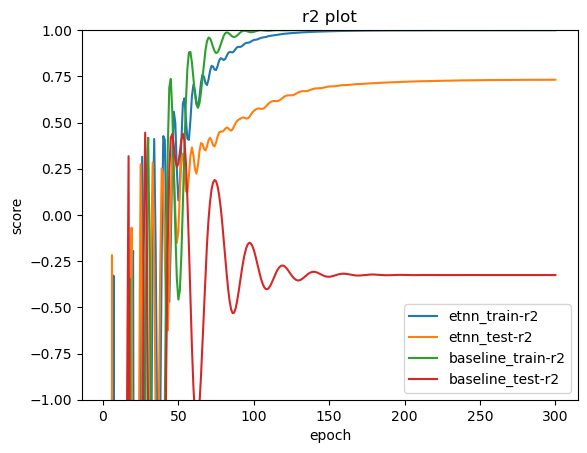

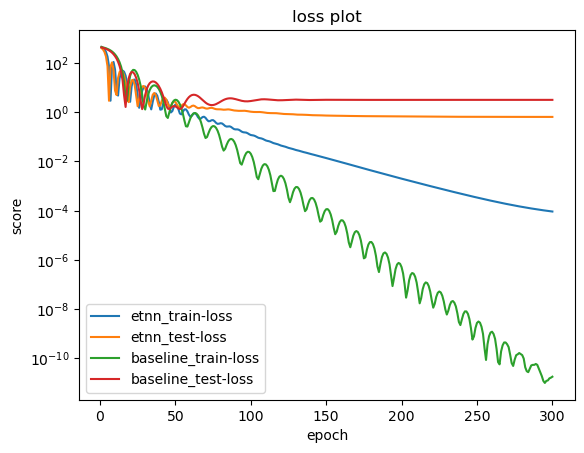

Rank 2 parameter configuration: Unnamed: 0                                     101
number                                         101
value                                     0.311744
datetime_start          2023-12-27 18:10:07.687461
datetime_complete       2023-12-27 18:10:08.035119
duration                    0 days 00:00:00.347658
params_batcher                               False
params_hidden_dim                              400
params_k                                         5
params_learning_rate                      0.000676
state                                     COMPLETE
Name: 101, dtype: object
Model params etnn: 427601


100%|██████████| 300/300 [00:02<00:00, 101.88it/s]


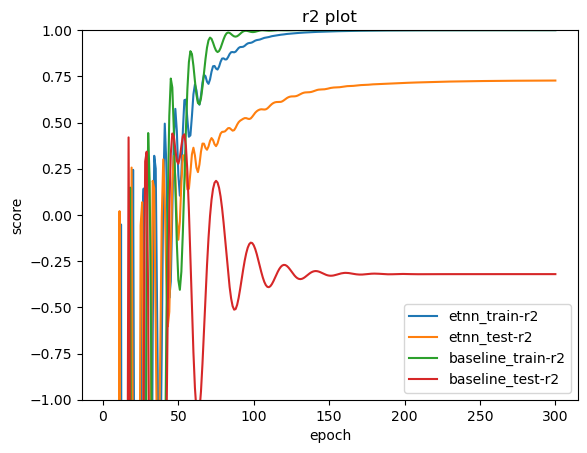

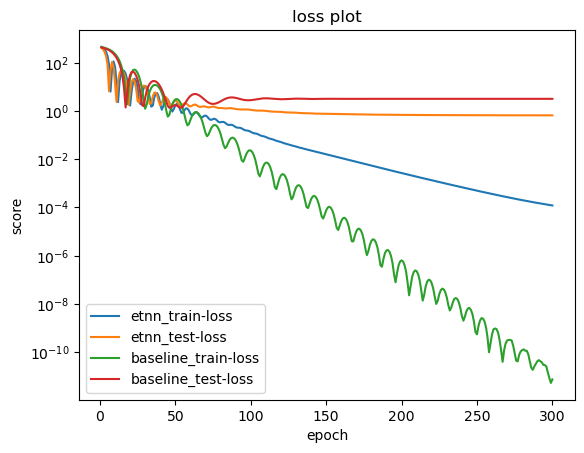

Rank 3 parameter configuration: Unnamed: 0                                     102
number                                         102
value                                     0.306537
datetime_start          2023-12-27 18:10:08.036119
datetime_complete       2023-12-27 18:10:08.450759
duration                    0 days 00:00:00.414640
params_batcher                               False
params_hidden_dim                              400
params_k                                         5
params_learning_rate                      0.000675
state                                     COMPLETE
Name: 102, dtype: object
Model params etnn: 427601


100%|██████████| 300/300 [00:02<00:00, 120.51it/s]


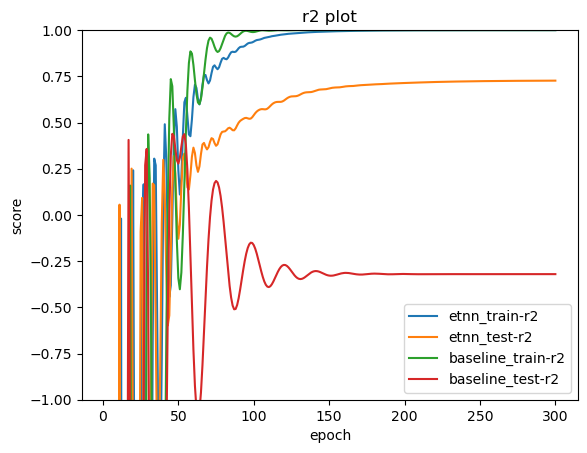

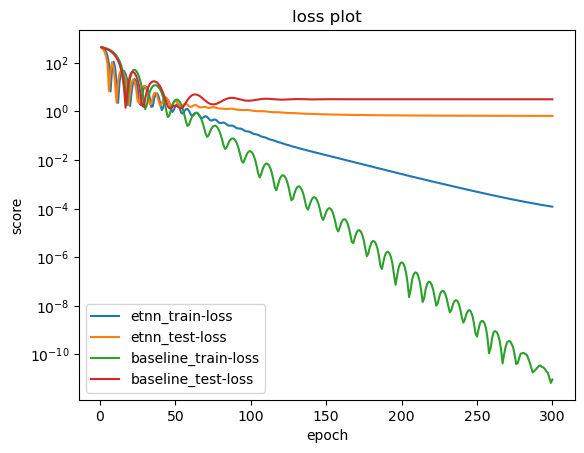

In [11]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 10

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

## Dataset size 100

Rank 1 parameter configuration: Unnamed: 0                                      36
number                                          36
value                                     0.088247
datetime_start          2023-12-27 18:11:19.896367
datetime_complete       2023-12-27 18:11:20.783913
duration                    0 days 00:00:00.887546
params_batcher                                True
params_hidden_dim                               32
params_k                                         1
params_learning_rate                      0.000213
state                                     COMPLETE
Name: 36, dtype: object
Model params etnn: 3297


100%|██████████| 300/300 [00:12<00:00, 24.64it/s]


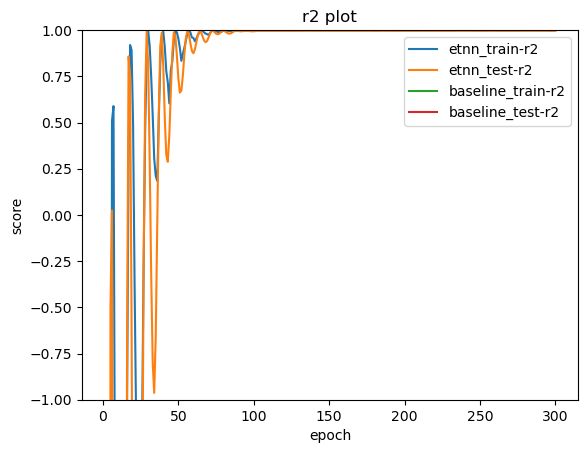

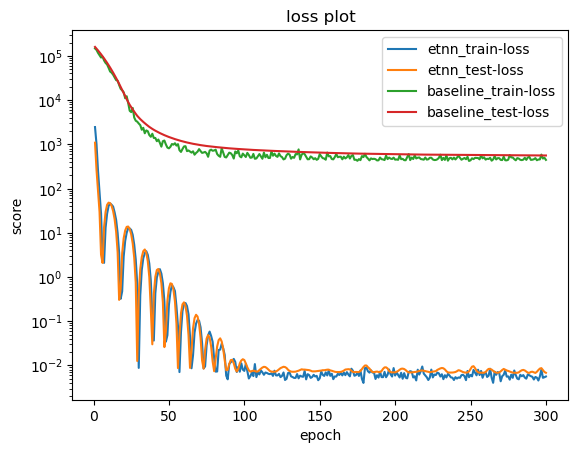

Rank 2 parameter configuration: Unnamed: 0                                      41
number                                          41
value                                     0.021195
datetime_start          2023-12-27 18:11:24.350158
datetime_complete       2023-12-27 18:11:25.198637
duration                    0 days 00:00:00.848479
params_batcher                                True
params_hidden_dim                               32
params_k                                         1
params_learning_rate                      0.000212
state                                     COMPLETE
Name: 41, dtype: object
Model params etnn: 3297


100%|██████████| 300/300 [00:12<00:00, 24.81it/s]


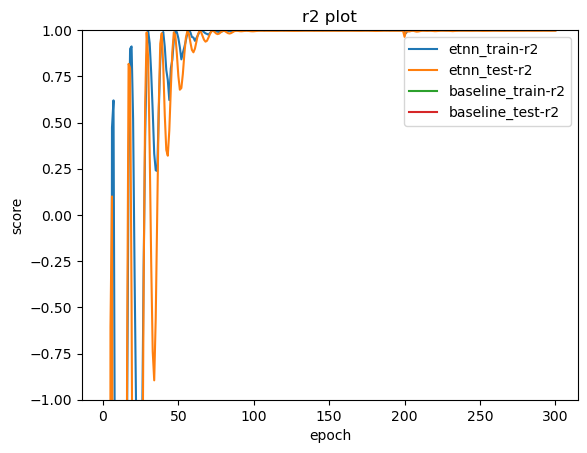

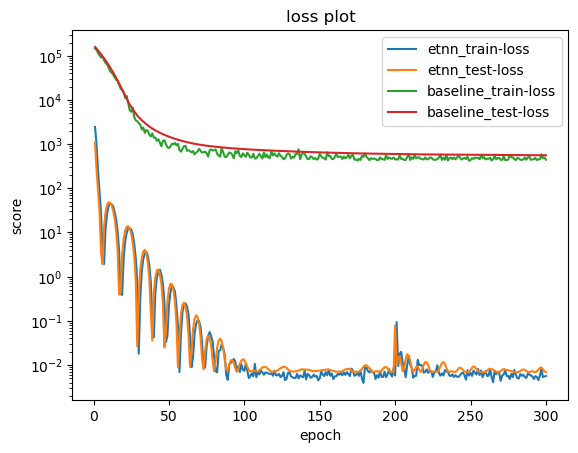

Rank 3 parameter configuration: Unnamed: 0                                      42
number                                          42
value                                    -0.002717
datetime_start          2023-12-27 18:11:25.199637
datetime_complete       2023-12-27 18:11:26.121162
duration                    0 days 00:00:00.921525
params_batcher                                True
params_hidden_dim                               32
params_k                                         1
params_learning_rate                      0.000212
state                                     COMPLETE
Name: 42, dtype: object
Model params etnn: 3297


100%|██████████| 300/300 [00:12<00:00, 24.95it/s]


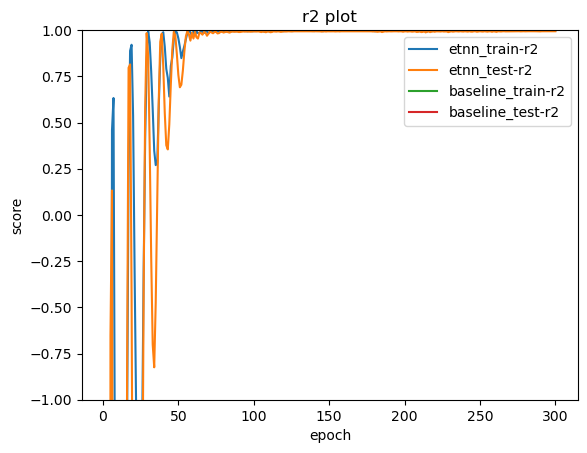

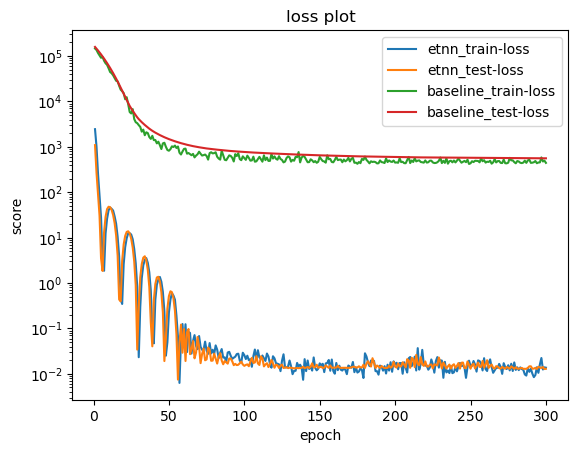

In [12]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     122
number                                         122
value                                     0.697403
datetime_start          2023-12-27 18:13:43.505326
datetime_complete       2023-12-27 18:13:44.565930
duration                    0 days 00:00:01.060604
params_batcher                                True
params_hidden_dim                              464
params_k                                         4
params_learning_rate                      0.003532
state                                     COMPLETE
Name: 122, dtype: object
Model params etnn: 573969


100%|██████████| 300/300 [00:11<00:00, 25.02it/s]


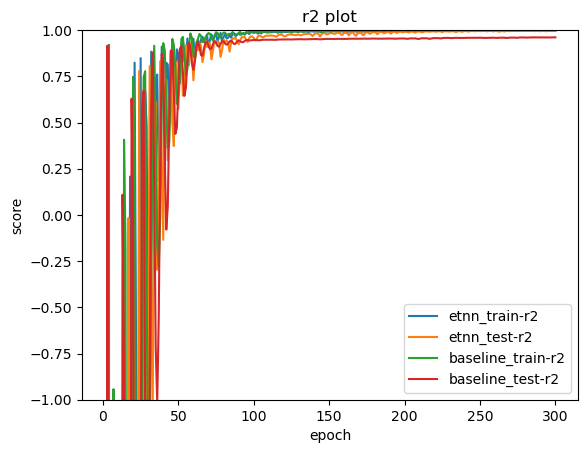

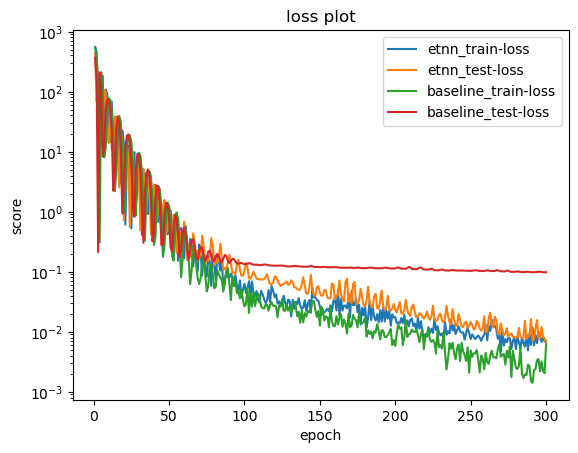

Rank 2 parameter configuration: Unnamed: 0                                      49
number                                          49
value                                     0.693167
datetime_start          2023-12-27 18:12:24.460930
datetime_complete       2023-12-27 18:12:25.785468
duration                    0 days 00:00:01.324538
params_batcher                               False
params_hidden_dim                              368
params_k                                         4
params_learning_rate                      0.002575
state                                     COMPLETE
Name: 49, dtype: object
Model params etnn: 362481


100%|██████████| 300/300 [00:11<00:00, 25.27it/s]


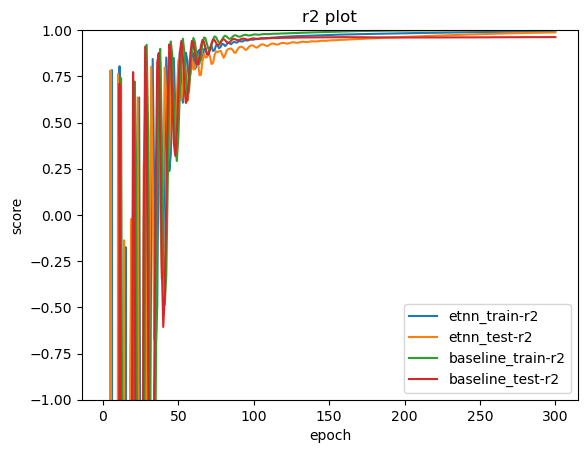

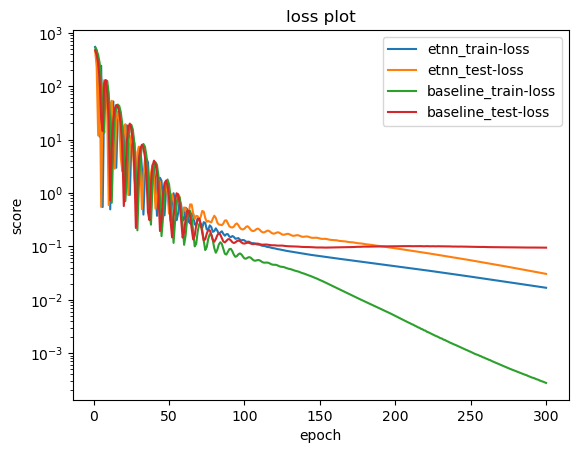

Rank 3 parameter configuration: Unnamed: 0                                      69
number                                          69
value                                     0.684056
datetime_start          2023-12-27 18:12:47.267613
datetime_complete       2023-12-27 18:12:48.349407
duration                    0 days 00:00:01.081794
params_batcher                                True
params_hidden_dim                              416
params_k                                         4
params_learning_rate                      0.002797
state                                     COMPLETE
Name: 69, dtype: object
Model params etnn: 462177


100%|██████████| 300/300 [00:11<00:00, 25.20it/s]


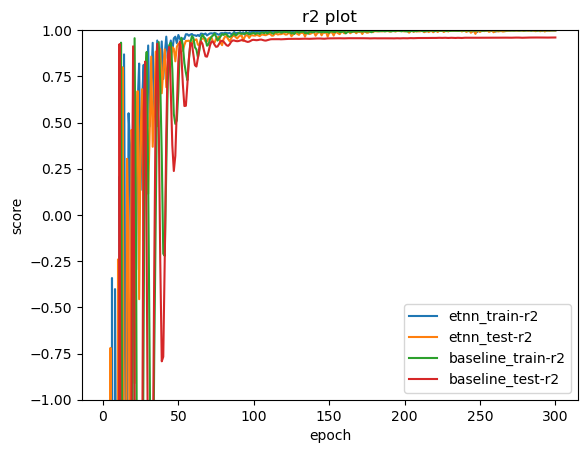

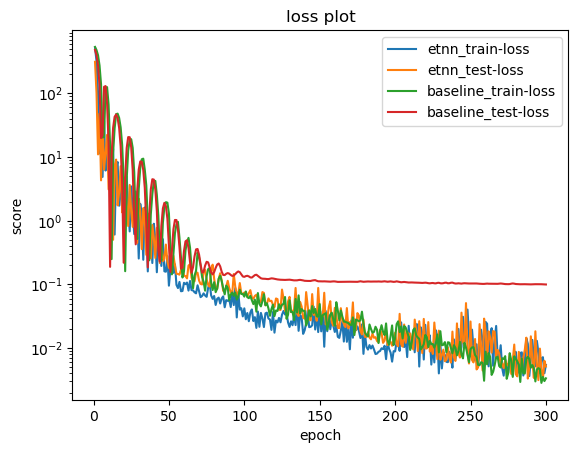

In [13]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                      83
number                                          83
value                                     0.672629
datetime_start          2023-12-27 18:16:50.320490
datetime_complete       2023-12-27 18:16:51.660676
duration                    0 days 00:00:01.340186
params_batcher                                True
params_hidden_dim                              464
params_k                                         2
params_learning_rate                      0.002104
state                                     COMPLETE
Name: 83, dtype: object
Model params etnn: 573969


100%|██████████| 300/300 [00:15<00:00, 19.09it/s]


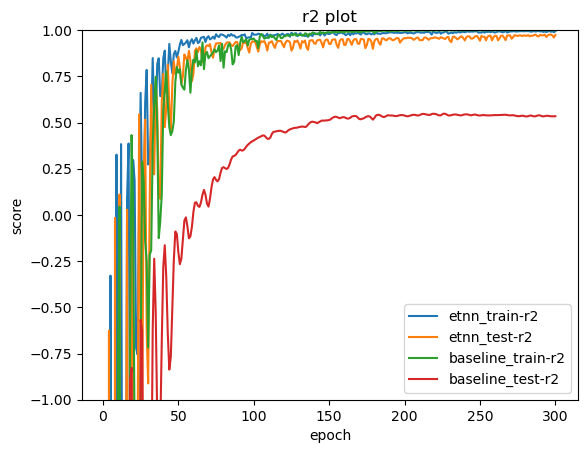

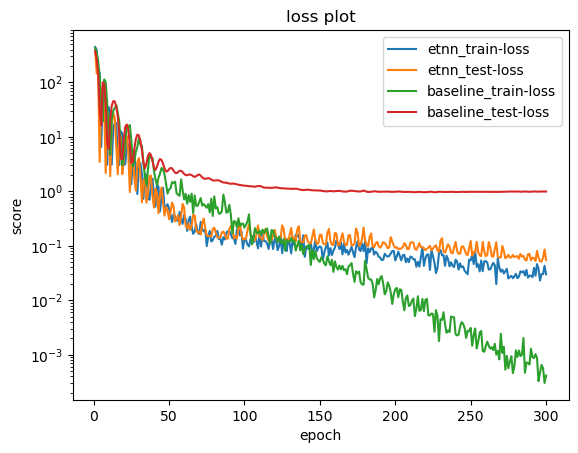

Rank 2 parameter configuration: Unnamed: 0                                     103
number                                         103
value                                     0.644331
datetime_start          2023-12-27 18:17:16.418775
datetime_complete       2023-12-27 18:17:17.837433
duration                    0 days 00:00:01.418658
params_batcher                                True
params_hidden_dim                              464
params_k                                         2
params_learning_rate                      0.002117
state                                     COMPLETE
Name: 103, dtype: object
Model params etnn: 573969


100%|██████████| 300/300 [00:16<00:00, 18.33it/s]


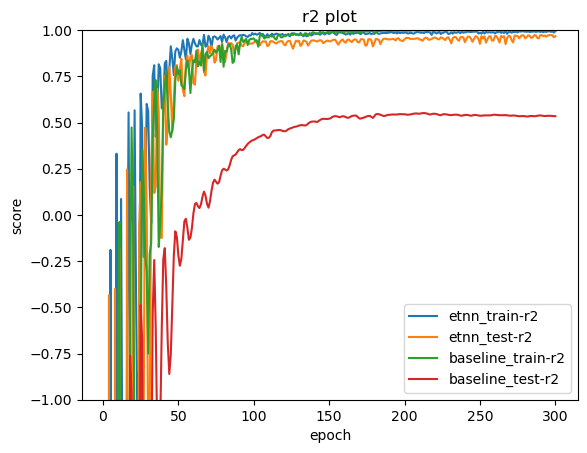

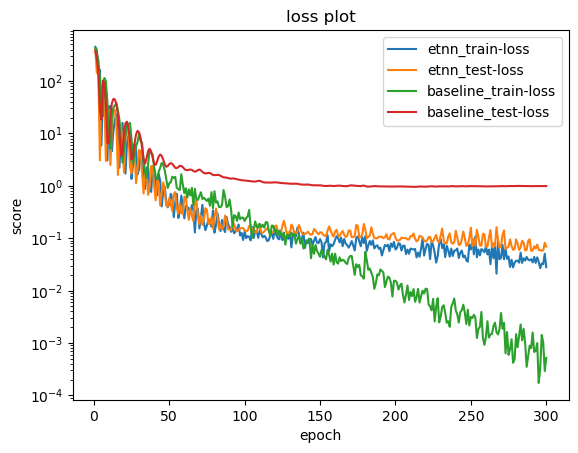

Rank 3 parameter configuration: Unnamed: 0                                     183
number                                         183
value                                     0.620413
datetime_start          2023-12-27 18:19:07.022983
datetime_complete       2023-12-27 18:19:08.311205
duration                    0 days 00:00:01.288222
params_batcher                               False
params_hidden_dim                              480
params_k                                         3
params_learning_rate                      0.001794
state                                     COMPLETE
Name: 183, dtype: object
Model params etnn: 613921


100%|██████████| 300/300 [00:16<00:00, 17.98it/s]


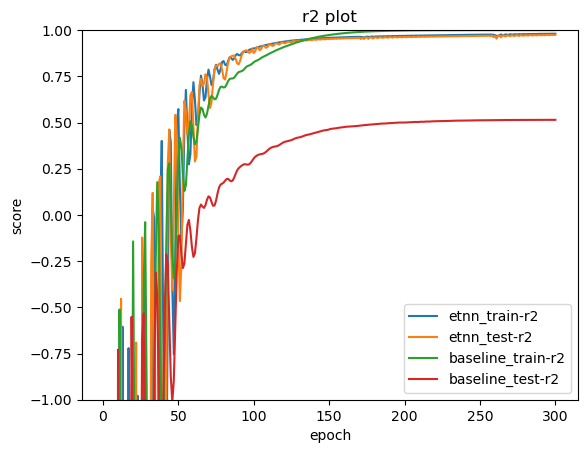

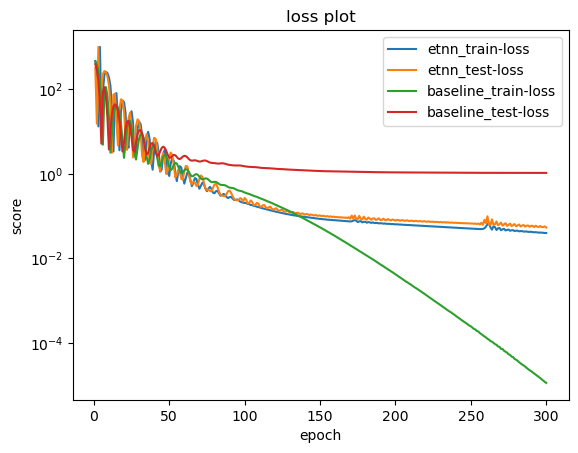

In [14]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 100

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

## Dataset size 1000

Rank 1 parameter configuration: Unnamed: 0                                      27
number                                          27
value                                    -0.083115
datetime_start          2023-12-27 18:23:58.089671
datetime_complete       2023-12-27 18:24:07.601772
duration                    0 days 00:00:09.512101
params_batcher                               False
params_hidden_dim                              112
params_k                                         1
params_learning_rate                      0.000017
state                                     COMPLETE
Name: 27, dtype: object
Model params etnn: 35057


100%|██████████| 300/300 [01:42<00:00,  2.93it/s]


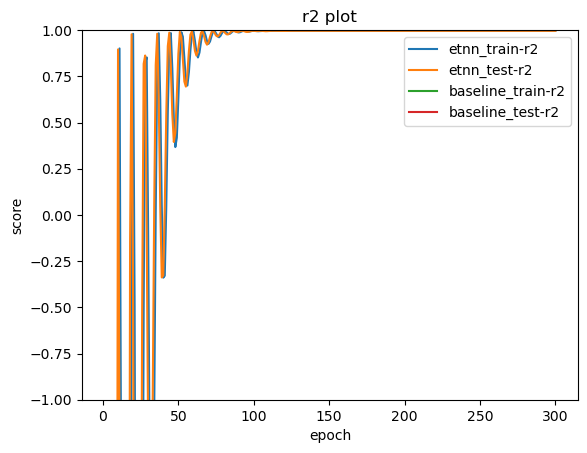

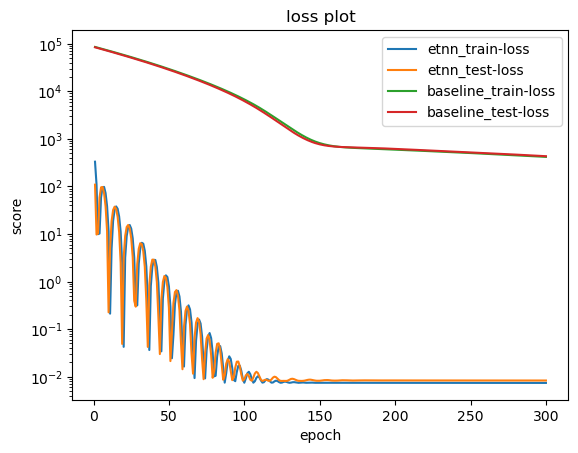

Rank 2 parameter configuration: Unnamed: 0                                       6
number                                           6
value                                    -2.220483
datetime_start          2023-12-27 18:20:34.020629
datetime_complete       2023-12-27 18:20:43.935579
duration                    0 days 00:00:09.914950
params_batcher                               False
params_hidden_dim                              112
params_k                                         1
params_learning_rate                      0.000034
state                                     COMPLETE
Name: 6, dtype: object
Model params etnn: 35057


100%|██████████| 300/300 [01:41<00:00,  2.95it/s]


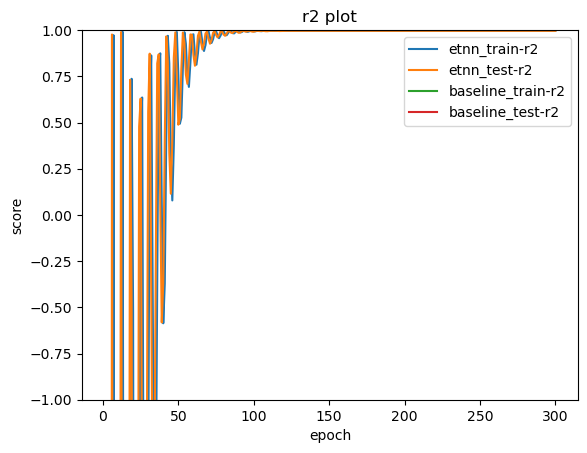

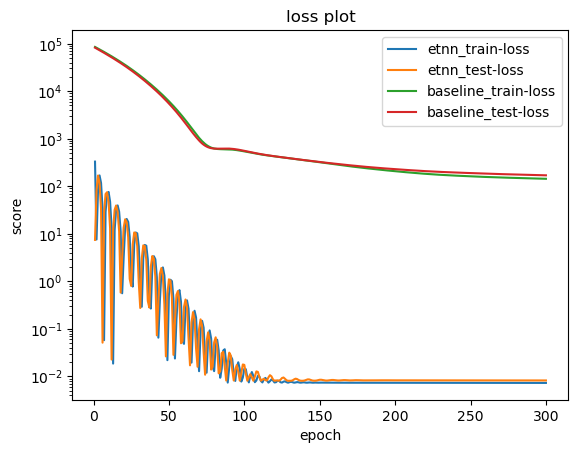

Rank 3 parameter configuration: Unnamed: 0                                      14
number                                          14
value                                    -5.771737
datetime_start          2023-12-27 18:21:54.960164
datetime_complete       2023-12-27 18:22:04.266343
duration                    0 days 00:00:09.306179
params_batcher                               False
params_hidden_dim                              112
params_k                                         1
params_learning_rate                      0.000099
state                                     COMPLETE
Name: 14, dtype: object
Model params etnn: 35057


100%|██████████| 300/300 [01:41<00:00,  2.96it/s]


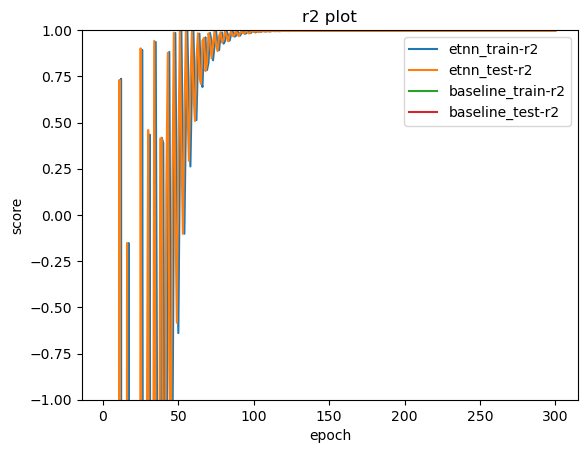

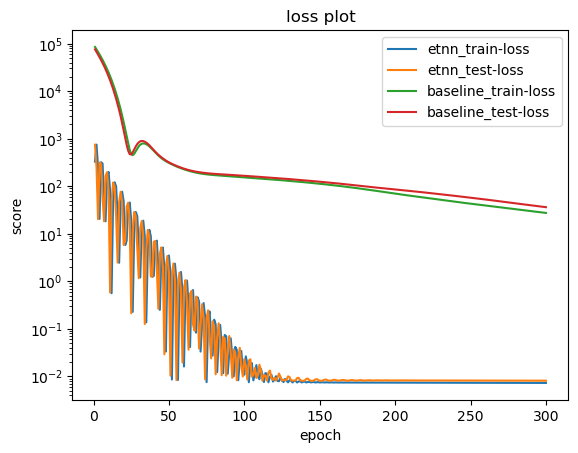

In [15]:
normalized = False
post_normalized = False
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                      50
number                                          50
value                                     0.799387
datetime_start          2023-12-27 18:34:30.897483
datetime_complete       2023-12-27 18:34:39.631712
duration                    0 days 00:00:08.734229
params_batcher                               False
params_hidden_dim                              240
params_k                                         4
params_learning_rate                      0.004329
state                                     COMPLETE
Name: 50, dtype: object
Model params etnn: 155761


100%|██████████| 300/300 [01:29<00:00,  3.34it/s]


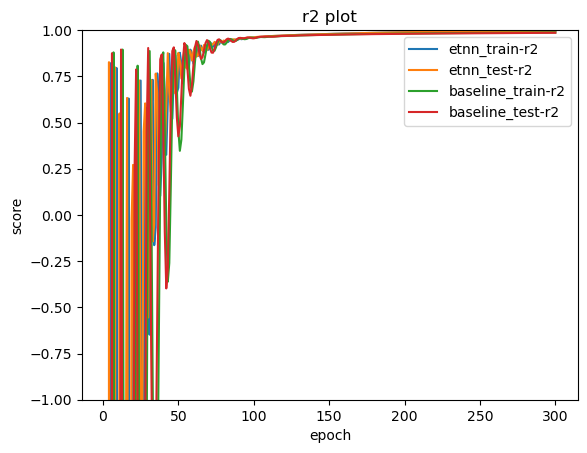

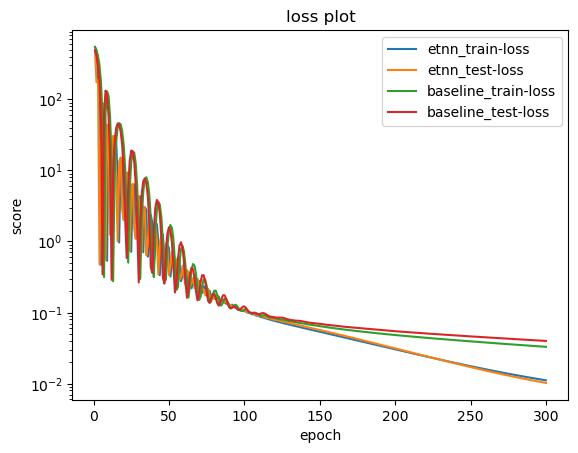

Rank 2 parameter configuration: Unnamed: 0                                      76
number                                          76
value                                     0.562801
datetime_start          2023-12-27 18:38:18.665697
datetime_complete       2023-12-27 18:38:26.629969
duration                    0 days 00:00:07.964272
params_batcher                               False
params_hidden_dim                              256
params_k                                         5
params_learning_rate                       0.00312
state                                     COMPLETE
Name: 76, dtype: object
Model params etnn: 176897


100%|██████████| 300/300 [01:29<00:00,  3.37it/s]


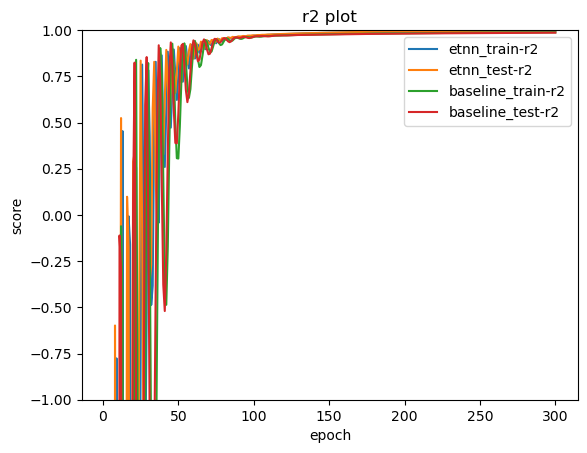

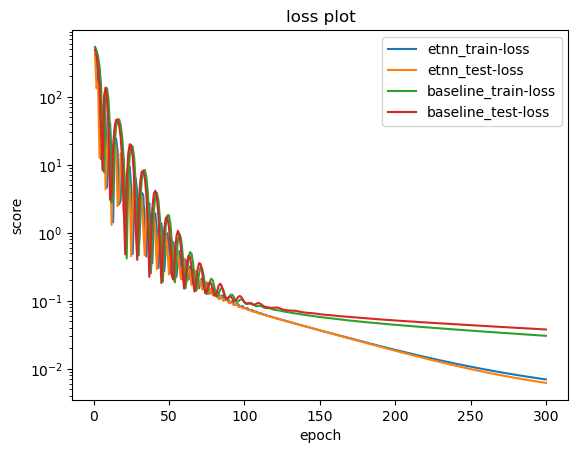

Rank 3 parameter configuration: Unnamed: 0                                      92
number                                          92
value                                     0.504616
datetime_start          2023-12-27 18:40:25.455179
datetime_complete       2023-12-27 18:40:33.609000
duration                    0 days 00:00:08.153821
params_batcher                               False
params_hidden_dim                              288
params_k                                         5
params_learning_rate                      0.002571
state                                     COMPLETE
Name: 92, dtype: object
Model params etnn: 223201


100%|██████████| 300/300 [01:30<00:00,  3.33it/s]


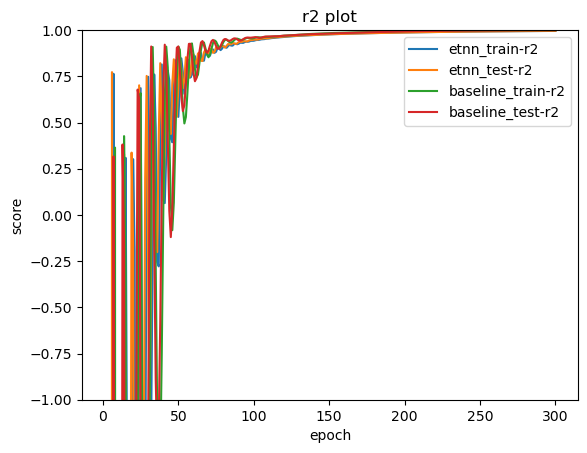

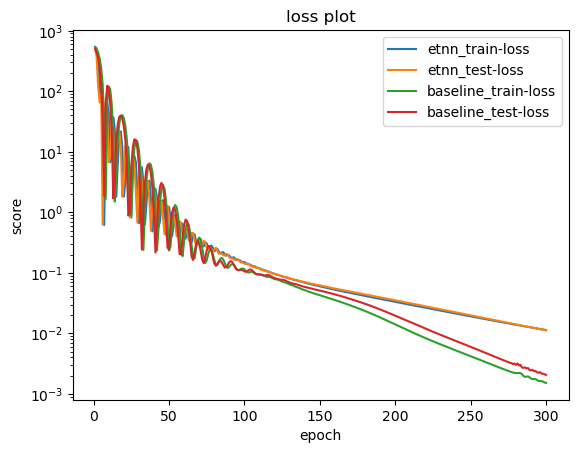

In [16]:
normalized = True
post_normalized = False
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)

Rank 1 parameter configuration: Unnamed: 0                                     109
number                                         109
value                                     0.509864
datetime_start          2023-12-27 18:59:58.734271
datetime_complete       2023-12-27 19:00:08.955814
duration                    0 days 00:00:10.221543
params_batcher                               False
params_hidden_dim                              448
params_k                                         5
params_learning_rate                      0.003191
state                                     COMPLETE
Name: 109, dtype: object
Model params etnn: 535361


100%|██████████| 300/300 [02:05<00:00,  2.39it/s]


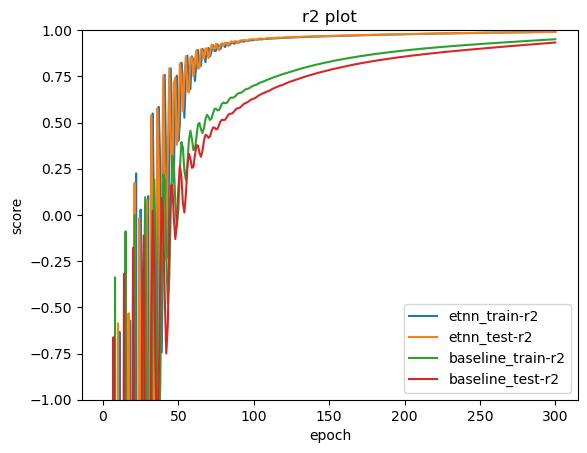

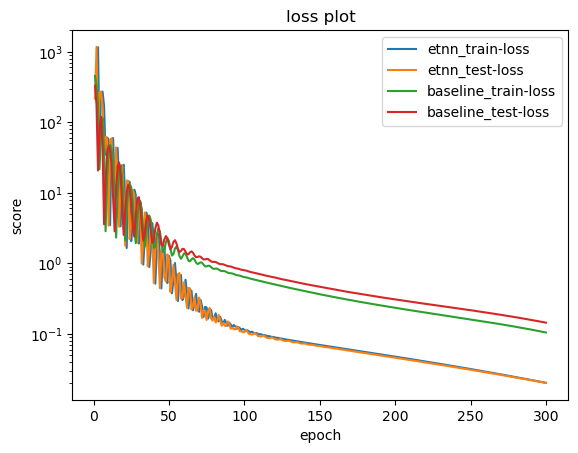

Rank 2 parameter configuration: Unnamed: 0                                      91
number                                          91
value                                     0.456844
datetime_start          2023-12-27 18:56:54.101367
datetime_complete       2023-12-27 18:57:04.864626
duration                    0 days 00:00:10.763259
params_batcher                               False
params_hidden_dim                              432
params_k                                         5
params_learning_rate                      0.002088
state                                     COMPLETE
Name: 91, dtype: object
Model params etnn: 498097


100%|██████████| 300/300 [02:06<00:00,  2.37it/s]


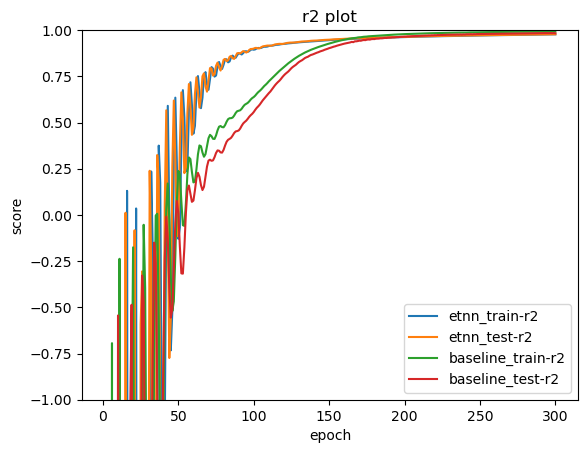

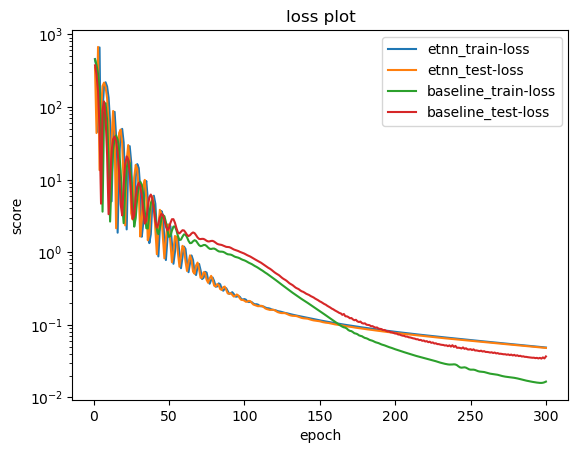

Rank 3 parameter configuration: Unnamed: 0                                      23
number                                          23
value                                     0.425685
datetime_start          2023-12-27 18:45:20.146069
datetime_complete       2023-12-27 18:45:30.433321
duration                    0 days 00:00:10.287252
params_batcher                               False
params_hidden_dim                              464
params_k                                         4
params_learning_rate                      0.001838
state                                     COMPLETE
Name: 23, dtype: object
Model params etnn: 573969


100%|██████████| 300/300 [02:05<00:00,  2.39it/s]


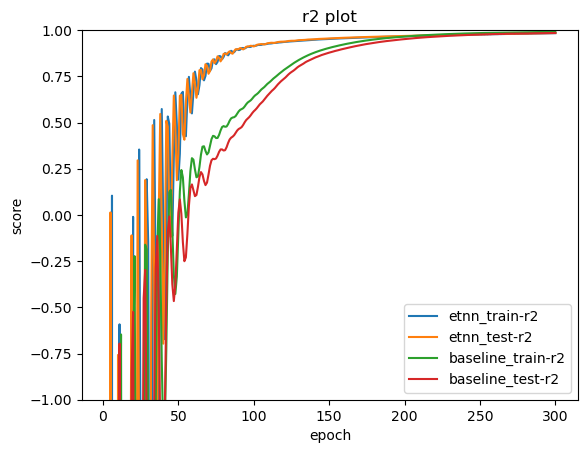

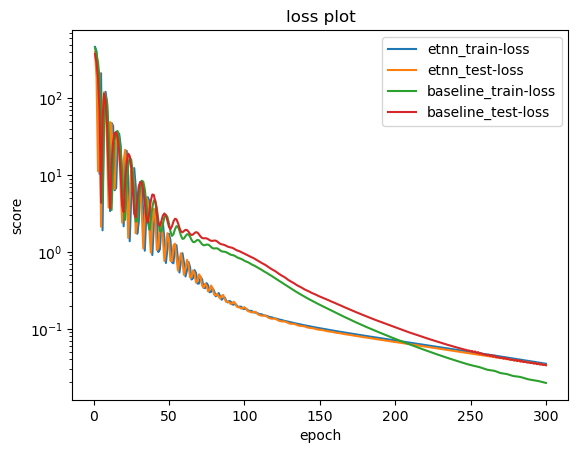

In [17]:
normalized = False
post_normalized = True
size_elem = 10
dataset_size = 1000

config_table = pd.read_csv(f"csvs/single-node_t-{node_type}_n-{size_elem}_normalized-{normalized}_post-normalized-{post_normalized}_dataset-size-{dataset_size}.csv")

# sort config storage
config_table = config_table.sort_values(by=['value'], ascending=False)

# iterate over top 3 best configs
for i in range(3):
    # get entry from dataframe
    entry = config_table.iloc[i]

    # print information to console
    print(f"Rank {i+1} parameter configuration: {entry}")

    run(i, entry, size_elem, normalized, node_type, dataset_size)